In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 14.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=f00b65b14f43f931c54127cfbf18dae82d82f36a688d18d135f076125e61c4f7
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


# Table of contents
1. Importing Libraries and Datasets
2. EDA & Data Cleaning - Check for duplicates, NA values
3. Labelling to Approved/Not Approved
4. Separate Training and Testing Sets


5. [On Train and Test Sets] Feature Engineering - Encoding
6. [On Train and Test Sets] Feature Selection - Feature Importance, Correlation Matrix
7. [On Train Set] Identify Imbalanced Data
8. [On Train Set] Smote-NC
9. [On Train Set] PCA (including Feature Scaling and Normalization)

Method 1 (Baseline Evaluation)
10. Train the models on default hyperparameters
11. Evaluate the Models

Method 2 (Optimise Models with GridSearchCV)
12. Decision Tree
13. Random Forest
14. Logistic Regression

15. Compare Models



# Importing Libraries and Datasets

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import random
from sklearn.preprocessing import RobustScaler, StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score, f1_score, classification_report, roc_auc_score, roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import RandomizedSearchCV
from imblearn.over_sampling import SMOTENC
from itertools import product
from lime.lime_tabular import LimeTabularExplainer

In [ ]:
credit_record = pd.read_csv("credit_record.csv")
application_record = pd.read_csv("application_record.csv")

# EDA and Data Cleaning

In [ ]:
credit_record.head()

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C


In [ ]:
application_record.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1.0,0.0,0.0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1.0,0.0,0.0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0.0,0.0,0.0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0.0,1.0,1.0,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0.0,1.0,1.0,Sales staff,1.0


In [ ]:
credit_record.info(), application_record.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   ID              1048575 non-null  int64 
 1   MONTHS_BALANCE  1048575 non-null  int64 
 2   STATUS          1048575 non-null  object
dtypes: int64(2), object(1)
memory usage: 24.0+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211538 entries, 0 to 211537
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   211538 non-null  int64  
 1   CODE_GENDER          211538 non-null  object 
 2   FLAG_OWN_CAR         211538 non-null  object 
 3   FLAG_OWN_REALTY      211538 non-null  object 
 4   CNT_CHILDREN         211538 non-null  int64  
 5   AMT_INCOME_TOTAL     211538 non-null  float64
 6   NAME_INCOME_TYPE     211538 non-null  object 
 7   NAME_EDUCATION_TYPE  211538 non-

(None, None)

In [ ]:
print("credit_record:",credit_record.shape)
print("application_record:",application_record.shape)

credit_record: (1048575, 3)
application_record: (211538, 18)


`credit_record` has 1,048,575 rows and 3 columns.

`application_record` has 438,557 rows and 18 columns.

## Check for Duplicates

### Check for Complete Duplicates

In [ ]:
credit_record.duplicated().sum(), application_record.duplicated().sum()

(0, 0)

There are no complete duplicate rows in either datasets.

### Check for duplicates in the ID Column

In [ ]:
id_counts = application_record['ID'].value_counts()
# filter for id counts that are > 1
id_counts = id_counts[id_counts > 1]
num_duplicate_ids = application_record['ID'].duplicated(keep=False).sum()

print(id_counts.head())
print(f"Total number of duplicate IDs: {num_duplicate_ids}")

Series([], Name: count, dtype: int64)
Total number of duplicate IDs: 0


In [ ]:
# investigate the rows with the same ID
application_record[application_record['ID'].isin(id_counts.index)].sort_values('ID')

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS



These duplicate IDs all comes in pairs, which could be due to 2 people applying for a Joint Credit Card. This is a possibility for some banks.

We assume that it is a Data Entry Error, and therefore, we drop the Duplicated IDs. As `application_record` and `credit_record` are not completely independent, we drop all 94 occurrences of the Duplicated ID.

In [ ]:
application_record = application_record.drop_duplicates(subset='ID', keep=False)
print("application_record:", application_record.shape)

application_record: (211538, 18)


`application_record` now has 438,463 rows and 18 columns.

## Check for NA Values

In [ ]:
credit_record.isna().sum(), application_record.isna().sum()

(ID                0
 MONTHS_BALANCE    0
 STATUS            0
 dtype: int64,
 ID                         0
 CODE_GENDER                0
 FLAG_OWN_CAR               0
 FLAG_OWN_REALTY            0
 CNT_CHILDREN               0
 AMT_INCOME_TOTAL           0
 NAME_INCOME_TYPE           0
 NAME_EDUCATION_TYPE        0
 NAME_FAMILY_STATUS         0
 NAME_HOUSING_TYPE          0
 DAYS_BIRTH                 0
 DAYS_EMPLOYED              0
 FLAG_MOBIL                 0
 FLAG_WORK_PHONE            1
 FLAG_PHONE                 1
 FLAG_EMAIL                 1
 OCCUPATION_TYPE        64794
 CNT_FAM_MEMBERS            1
 dtype: int64)

In [ ]:
# percentage of NA values in occupation_type column in  application_record
missing_percentage = (application_record['OCCUPATION_TYPE'].isna().sum() / len(application_record)) * 100
print(f"Percentage of missing values in occupation_type: {missing_percentage:.2f}%")

Percentage of missing values in occupation_type: 30.63%


There are no NA values in the `credit_record` dataset.

In the `application_record` dataset, there are NA values only in the `OCCUPATION_TYPE` column. However, there is a total of 134,177 rows with NA values, which makes up almost 30% of the dataset. Thus, it is not feasible to drop these rows.

In [ ]:
# replace NA values in OCCUPATION_TYPE to 'Unknown'
application_record['OCCUPATION_TYPE'] = application_record['OCCUPATION_TYPE'].fillna('Unknown')

## Converting Columns

In [ ]:
credit_record.nunique(), application_record.nunique()

(ID                45985
 MONTHS_BALANCE       61
 STATUS                8
 dtype: int64,
 ID                     211538
 CODE_GENDER                 2
 FLAG_OWN_CAR                2
 FLAG_OWN_REALTY             2
 CNT_CHILDREN               11
 AMT_INCOME_TOTAL          592
 NAME_INCOME_TYPE            5
 NAME_EDUCATION_TYPE         5
 NAME_FAMILY_STATUS          5
 NAME_HOUSING_TYPE           6
 DAYS_BIRTH              15006
 DAYS_EMPLOYED            7440
 FLAG_MOBIL                  1
 FLAG_WORK_PHONE             2
 FLAG_PHONE                  2
 FLAG_EMAIL                  2
 OCCUPATION_TYPE            19
 CNT_FAM_MEMBERS            12
 dtype: int64)

The ```FLAG_MOBIL``` (Is there a mobile phone) column in ```application_record``` has only 1 unique value. It can be dropped without affecting our analysis.

In [ ]:
application_record = application_record.drop('FLAG_MOBIL', axis=1)

Convert ```CODE_GENDER``` to binary format: 0 for F (Female) and 1 for M (Male)

Convert ```FLAG_OWN_CAR``` and ```FLAG_OWN_REALTY``` to binary / numerical format: 0 for N and 1 for Y

In [ ]:
application_record['CODE_GENDER'] = application_record['CODE_GENDER'].map({'M': 1, 'F': 0})
application_record['FLAG_OWN_CAR'] = application_record['FLAG_OWN_CAR'].map({'Y': 1, 'N': 0})
application_record['FLAG_OWN_REALTY'] = application_record['FLAG_OWN_REALTY'].map({'Y': 1, 'N': 0})

Convert ```DAYS_BIRTH``` into ```AGE``` (in years) of applicant. Convert ```DAYS_EMPLOYED``` into ```EMPLOYMENT_DURATION``` (in years) of applicant.

In [ ]:
# convert DAYS_BIRTH into age and DAYS_EMPLOYED into years
application_record['AGE'] = (application_record['DAYS_BIRTH'] // -365)
application_record['EMPLOYMENT_DURATION'] = (application_record['DAYS_EMPLOYED'] // -365)
application_record = application_record.drop(['DAYS_BIRTH', 'DAYS_EMPLOYED'], axis=1)

application_record.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,AGE,EMPLOYMENT_DURATION
0,5008804,1,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,1.0,0.0,0.0,Unknown,2.0,32,12
1,5008805,1,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,1.0,0.0,0.0,Unknown,2.0,32,12
2,5008806,1,1,1,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,0.0,0.0,0.0,Security staff,2.0,58,3
3,5008808,0,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,0.0,1.0,1.0,Sales staff,1.0,52,8
4,5008809,0,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,0.0,1.0,1.0,Sales staff,1.0,52,8


In [ ]:
application_record.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211538 entries, 0 to 211537
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   211538 non-null  int64  
 1   CODE_GENDER          211538 non-null  int64  
 2   FLAG_OWN_CAR         211538 non-null  int64  
 3   FLAG_OWN_REALTY      211538 non-null  int64  
 4   CNT_CHILDREN         211538 non-null  int64  
 5   AMT_INCOME_TOTAL     211538 non-null  float64
 6   NAME_INCOME_TYPE     211538 non-null  object 
 7   NAME_EDUCATION_TYPE  211538 non-null  object 
 8   NAME_FAMILY_STATUS   211538 non-null  object 
 9   NAME_HOUSING_TYPE    211538 non-null  object 
 10  FLAG_WORK_PHONE      211537 non-null  float64
 11  FLAG_PHONE           211537 non-null  float64
 12  FLAG_EMAIL           211537 non-null  float64
 13  OCCUPATION_TYPE      211538 non-null  object 
 14  CNT_FAM_MEMBERS      211537 non-null  float64
 15  AGE              

In [ ]:
for column in ['NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE']:
    print(f"Value counts for {column}:")
    print(application_record[column].value_counts())
    print()

Value counts for NAME_INCOME_TYPE:
NAME_INCOME_TYPE
Working                 108183
Commercial associate     49596
Pensioner                36565
State servant            17179
Student                     15
Name: count, dtype: int64

Value counts for NAME_EDUCATION_TYPE:
NAME_EDUCATION_TYPE
Secondary / secondary special    145288
Higher education                  56969
Incomplete higher                  7087
Lower secondary                    2037
Academic degree                     157
Name: count, dtype: int64

Value counts for NAME_FAMILY_STATUS:
NAME_FAMILY_STATUS
Married                 145116
Single / not married     26211
Civil marriage           17804
Separated                12969
Widow                     9438
Name: count, dtype: int64

Value counts for NAME_HOUSING_TYPE:
NAME_HOUSING_TYPE
House / apartment      190235
With parents             9363
Municipal apartment      6667
Rented apartment         2653
Office apartment         1895
Co-op apartment           725
Name: cou

### Check for logically inconsistent data or data out of expected range for numerical columns

In [ ]:
application_record.describe()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,AGE,EMPLOYMENT_DURATION
count,2.115380e+05,211538.000000,211538.000000,211538.000000,211538.000000,2.115380e+05,211537.000000,211537.000000,211537.000000,211537.000000,211538.000000,211538.000000
mean,5.599337e+06,0.325530,0.370496,0.674508,0.431246,1.864612e+05,0.216213,0.300283,0.096976,2.201412,43.314847,-167.537568
std,4.171335e+05,0.468574,0.482939,0.468560,0.731218,1.050113e+05,0.411662,0.458382,0.295926,0.903105,11.469567,381.054346
min,5.008804e+06,0.000000,0.000000,0.000000,0.000000,2.700000e+04,0.000000,0.000000,0.000000,1.000000,20.000000,-1001.000000
25%,5.243596e+06,0.000000,0.000000,0.000000,0.000000,1.215000e+05,0.000000,0.000000,0.000000,2.000000,34.000000,1.000000
50%,5.580952e+06,0.000000,0.000000,1.000000,0.000000,1.575000e+05,0.000000,0.000000,0.000000,2.000000,42.000000,4.000000
75%,5.838567e+06,1.000000,1.000000,1.000000,1.000000,2.250000e+05,0.000000,1.000000,0.000000,3.000000,53.000000,8.000000
max,6.840318e+06,1.000000,1.000000,1.000000,19.000000,3.950060e+06,1.000000,1.000000,1.000000,20.000000,69.000000,48.000000


There is unusual entry under ```EMPLOYMENT_DURATION``` where the minimum is -1001 years. We investigate this further.

In [ ]:
application_record[application_record['EMPLOYMENT_DURATION'] == -1001].head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,AGE,EMPLOYMENT_DURATION
7,5008812,0,0,1,0,283500.0,Pensioner,Higher education,Separated,House / apartment,0.0,0.0,0.0,Unknown,1.0,61,-1001
8,5008813,0,0,1,0,283500.0,Pensioner,Higher education,Separated,House / apartment,0.0,0.0,0.0,Unknown,1.0,61,-1001
9,5008814,0,0,1,0,283500.0,Pensioner,Higher education,Separated,House / apartment,0.0,0.0,0.0,Unknown,1.0,61,-1001
76,5008884,0,0,1,0,315000.0,Pensioner,Secondary / secondary special,Widow,House / apartment,0.0,0.0,0.0,Unknown,1.0,55,-1001
160,5008974,0,0,1,0,112500.0,Pensioner,Secondary / secondary special,Married,House / apartment,0.0,0.0,0.0,Unknown,2.0,61,-1001


According to the Dataset Description, a negative value for ```EMPLOYMENT_DURATION``` means that the person is currently unemployed. We explore the subset of data for negative ```EMPLOYMENT_DURATION``` values below.

In [ ]:
# Exploring the income types and occupations of these unemployed applicants
income_type = application_record[application_record['EMPLOYMENT_DURATION']<0]['NAME_INCOME_TYPE'].unique()
occupation_type = application_record[application_record['EMPLOYMENT_DURATION']<0]['OCCUPATION_TYPE'].unique()
employment_duration = application_record[application_record['EMPLOYMENT_DURATION']<0]['EMPLOYMENT_DURATION'].unique()
print("Income types:", income_type,
      "\nOccupation types:", occupation_type,
      "\nEmployment Duration:", employment_duration)

Income types: ['Pensioner'] 
Occupation types: ['Unknown'] 
Employment Duration: [-1001]


It seems that all applicants who have ```EMPLOYMENT_DURATION``` of less than 0 receive pension, take on the NA value in ```OCCUPATION_TYPE``` and all have the same ```EMPLOYMENT_DURATION``` of -1001 years. This could mean that all applicants with ```EMPLOYMENT_DURATION``` less than 0 are retired.

We will convert these NA values to a new value ```None``` to differentiate unemployed applicants from applicants with missing ```OCCUPATION_TYPE``` values.

We will also replace ```EMPLOYMENT_DURATION``` values of -1001 to -1, such that the variance will not be too large for PCA later on.

In [ ]:
# Replace occupation type for employment durations less than 0 to None
application_record['OCCUPATION_TYPE'] = np.where(application_record['EMPLOYMENT_DURATION'] < 0, 'None', application_record['OCCUPATION_TYPE'])

# Replace employment duration values of less than 0 to -1
application_record['EMPLOYMENT_DURATION'] = np.where(application_record['EMPLOYMENT_DURATION'] < 0, -1, application_record['EMPLOYMENT_DURATION'])

application_record[application_record['EMPLOYMENT_DURATION'] < 0].head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,AGE,EMPLOYMENT_DURATION
7,5008812,0,0,1,0,283500.0,Pensioner,Higher education,Separated,House / apartment,0.0,0.0,0.0,None,1.0,61,-1
8,5008813,0,0,1,0,283500.0,Pensioner,Higher education,Separated,House / apartment,0.0,0.0,0.0,None,1.0,61,-1
9,5008814,0,0,1,0,283500.0,Pensioner,Higher education,Separated,House / apartment,0.0,0.0,0.0,None,1.0,61,-1
76,5008884,0,0,1,0,315000.0,Pensioner,Secondary / secondary special,Widow,House / apartment,0.0,0.0,0.0,None,1.0,55,-1
160,5008974,0,0,1,0,112500.0,Pensioner,Secondary / secondary special,Married,House / apartment,0.0,0.0,0.0,None,2.0,61,-1


# Converting STATUS column in credit_record to Approved / Not Approved

In [ ]:
credit_record['STATUS'].value_counts()

,count
STATUS,
C,442031
0,383120
X,209230
1,11090
5,1693
2,868
3,320
4,223


According to this [link](https://www.mas.gov.sg/regulation/explainers/ongoing-credit-checks-and-requirements/borrowers-who-are-60-days-past-due#:~:text=If%20a%20borrower's%20debt%20on,cards%20or%20unsecured%20credit%20facilities.) by the Monetary Authority of Singapore, "Financial institutions cannot grant further unsecured credit to borrowers who are 60 days past due on any credit card or unsecured credit facility.".

Hence, our approach is as follows:

1) Initial Classification (Based on MONTHS_BALANCE = 0):

Bad (0): If STATUS = 2, 3, 4, or 5.

Good (1): If STATUS = 0, C, or X.

Intermediate: If STATUS = 1.

2) Handling intermediate clients

Count the total number of overdue months where STATUS is 1, 2, 3, 4, or 5. If the sum is greater than 1 and the last overdue month is within 2 months from the most recent overdue month, classify as "Bad" (0).

Example: the client had an overdue status in January (STATUS = 1), paid off in February (STATUS = C), and was overdue again in March (STATUS = 1). For this client, the total overdue months = 2 > 1 and the last overdue month (January) is within the most recent overdue month (March). Return 0 (classify as "Bad").

In [ ]:
# Ensure that the data is sorted by ID and MONTHS_BALANCE
credit_record = credit_record.sort_values(['ID', 'MONTHS_BALANCE'], ascending = [True, False])

def classify_client(client):
    # Initial classification based on the most recent month (MONTHS_BALANCE = 0)
    most_recent = client[client['MONTHS_BALANCE'] == 0]

    if len(most_recent) > 0:
        status = most_recent['STATUS'].iloc[0]
        if status in ['2', '3', '4', '5']:
            return '0'
        elif status in ['0', 'C', 'X']:
            return '1'

    overdue_months = client[client['STATUS'].isin(['1', '2', '3', '4', '5'])]

    if len(overdue_months) > 1:
        last_overdue = overdue_months['MONTHS_BALANCE'].iloc[1]
        most_recent_overdue = overdue_months['MONTHS_BALANCE'].iloc[0]

        if most_recent_overdue - last_overdue <= 2:
            return '0'

    return '1'

# Apply the function to each client
result = credit_record.groupby('ID').apply(classify_client).reset_index()
result.columns = ['ID', 'Classification']

result['Classification'].value_counts()

<ipython-input-26-772e748268a6>:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  result = credit_record.groupby('ID').apply(classify_client).reset_index()


,count
Classification,
1,45380
0,605


In [ ]:
result.head()

,ID,Classification
0,5001711,1
1,5001712,1
2,5001713,1
3,5001714,1
4,5001715,1


Merge ```result``` to the ```application_record``` dataset based on ID

In [ ]:
df = application_record.merge(result, on='ID', how = 'inner')
df.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,AGE,EMPLOYMENT_DURATION,Classification
0,5008804,1,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,1.0,0.0,0.0,Unknown,2.0,32,12,1
1,5008805,1,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,1.0,0.0,0.0,Unknown,2.0,32,12,1
2,5008806,1,1,1,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,0.0,0.0,0.0,Security staff,2.0,58,3,1
3,5008808,0,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,0.0,1.0,1.0,Sales staff,1.0,52,8,1
4,5008809,0,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,0.0,1.0,1.0,Sales staff,1.0,52,8,1


In [ ]:
df['Classification'].value_counts()

,count
Classification,
1,35612
0,493


There are 556 bad clients and 35,901 good clients.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36105 entries, 0 to 36104
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   36105 non-null  int64  
 1   CODE_GENDER          36105 non-null  int64  
 2   FLAG_OWN_CAR         36105 non-null  int64  
 3   FLAG_OWN_REALTY      36105 non-null  int64  
 4   CNT_CHILDREN         36105 non-null  int64  
 5   AMT_INCOME_TOTAL     36105 non-null  float64
 6   NAME_INCOME_TYPE     36105 non-null  object 
 7   NAME_EDUCATION_TYPE  36105 non-null  object 
 8   NAME_FAMILY_STATUS   36105 non-null  object 
 9   NAME_HOUSING_TYPE    36105 non-null  object 
 10  FLAG_WORK_PHONE      36105 non-null  float64
 11  FLAG_PHONE           36105 non-null  float64
 12  FLAG_EMAIL           36105 non-null  float64
 13  OCCUPATION_TYPE      36105 non-null  object 
 14  CNT_FAM_MEMBERS      36105 non-null  float64
 15  AGE                  36105 non-null 

In [ ]:
# drop the ID Column
df = df.drop('ID', axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36105 entries, 0 to 36104
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CODE_GENDER          36105 non-null  int64  
 1   FLAG_OWN_CAR         36105 non-null  int64  
 2   FLAG_OWN_REALTY      36105 non-null  int64  
 3   CNT_CHILDREN         36105 non-null  int64  
 4   AMT_INCOME_TOTAL     36105 non-null  float64
 5   NAME_INCOME_TYPE     36105 non-null  object 
 6   NAME_EDUCATION_TYPE  36105 non-null  object 
 7   NAME_FAMILY_STATUS   36105 non-null  object 
 8   NAME_HOUSING_TYPE    36105 non-null  object 
 9   FLAG_WORK_PHONE      36105 non-null  float64
 10  FLAG_PHONE           36105 non-null  float64
 11  FLAG_EMAIL           36105 non-null  float64
 12  OCCUPATION_TYPE      36105 non-null  object 
 13  CNT_FAM_MEMBERS      36105 non-null  float64
 14  AGE                  36105 non-null  int64  
 15  EMPLOYMENT_DURATION  36105 non-null 

# Separate Training and Testing Sets

In [ ]:
X = df.drop('Classification', axis=1)
y = df['Classification']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Convert X_train, X_test, y_train, y_test back into Data Frames for ease
X_train = pd.DataFrame(X_train, columns=X.columns)
X_test = pd.DataFrame(X_test, columns=X.columns)
y_train = pd.Series(y_train)
y_test = pd.Series(y_test)

In [ ]:
print(f"Initial X shape: {X.shape}, Initial y shape: {y.shape}")
print(f"Train X shape: {X_train.shape}, Train y shape: {y_train.shape}")
print(f"Test X shape: {X_test.shape}, Test y shape: {y_test.shape}")

Initial X shape: (36105, 16), Initial y shape: (36105,)
Train X shape: (25273, 16), Train y shape: (25273,)
Test X shape: (10832, 16), Test y shape: (10832,)


In [ ]:
print(X_train)
print(df)

       CODE_GENDER  FLAG_OWN_CAR  FLAG_OWN_REALTY  CNT_CHILDREN  \
14596            1             0                1             0   
13628            1             0                0             0   
18521            0             1                1             1   
1070             1             1                1             0   
25475            0             0                1             0   
...            ...           ...              ...           ...   
12122            1             0                0             0   
998              0             0                1             0   
31188            0             0                1             1   
25726            0             0                1             0   
29417            0             0                0             0   

       AMT_INCOME_TOTAL      NAME_INCOME_TYPE            NAME_EDUCATION_TYPE  \
14596          112500.0               Working               Higher education   
13628          190399.5  Commercial

## Correlation Analysis

### Numerical Columns

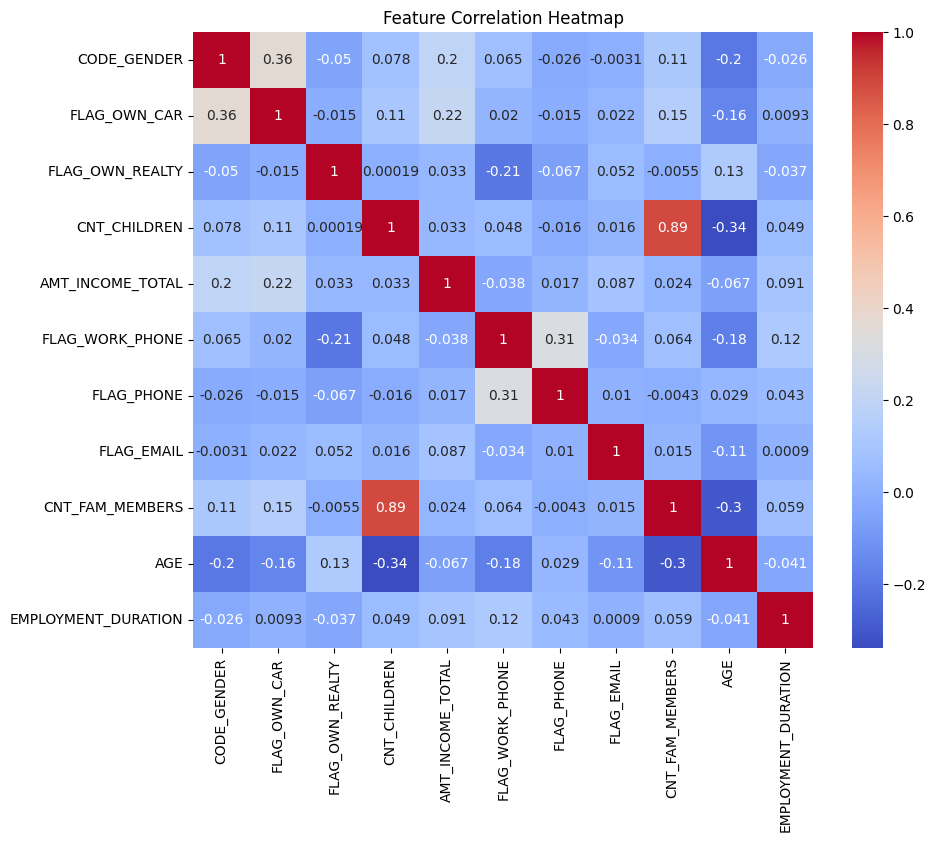

In [ ]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns

plt.figure(figsize=(10, 8))
sns.heatmap(df[numeric_columns].corr(), cmap='coolwarm', annot=True)
plt.title('Feature Correlation Heatmap')
plt.show()

There seems to be a strong correlation between ```CNT_FAM_MEMBERS``` and ```CNT_CHILDREN``` (0.89). We will keep ```CNT_FAM_MEMBERS``` and drop ```CNT_CHILDREN``` later.

### Categorical Columns

In [ ]:
categorical_columns = df.select_dtypes(include=['object']).columns

# Use one-hot encoding for the categorical variables
df_encoded = pd.get_dummies(df, columns=categorical_columns, drop_first=False)

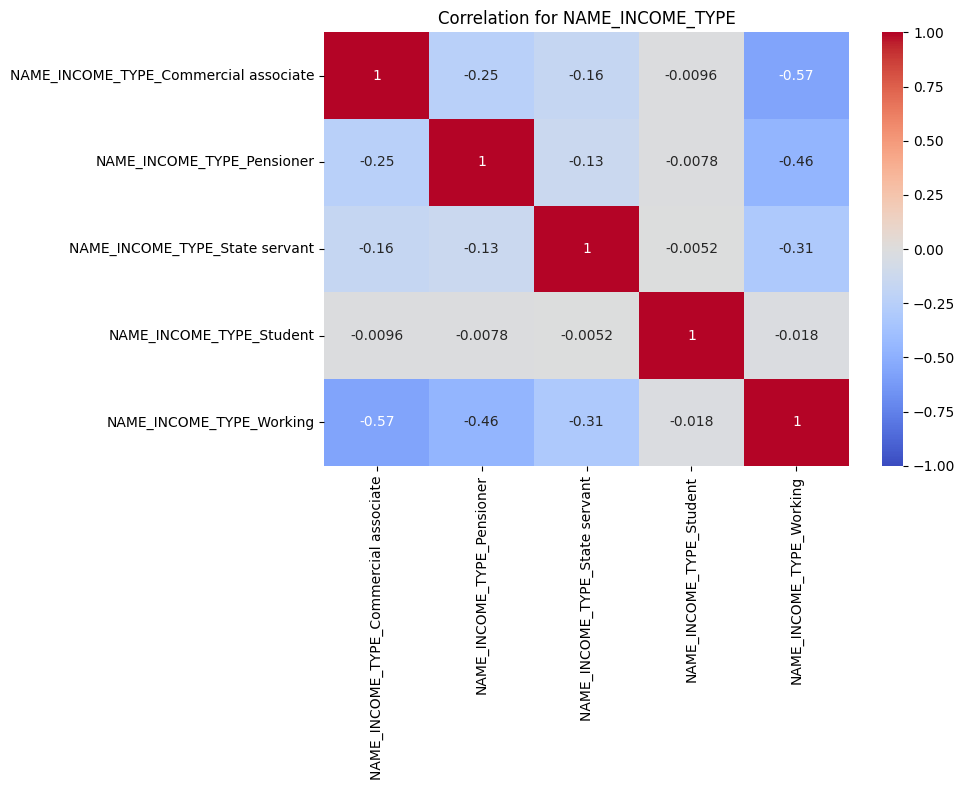

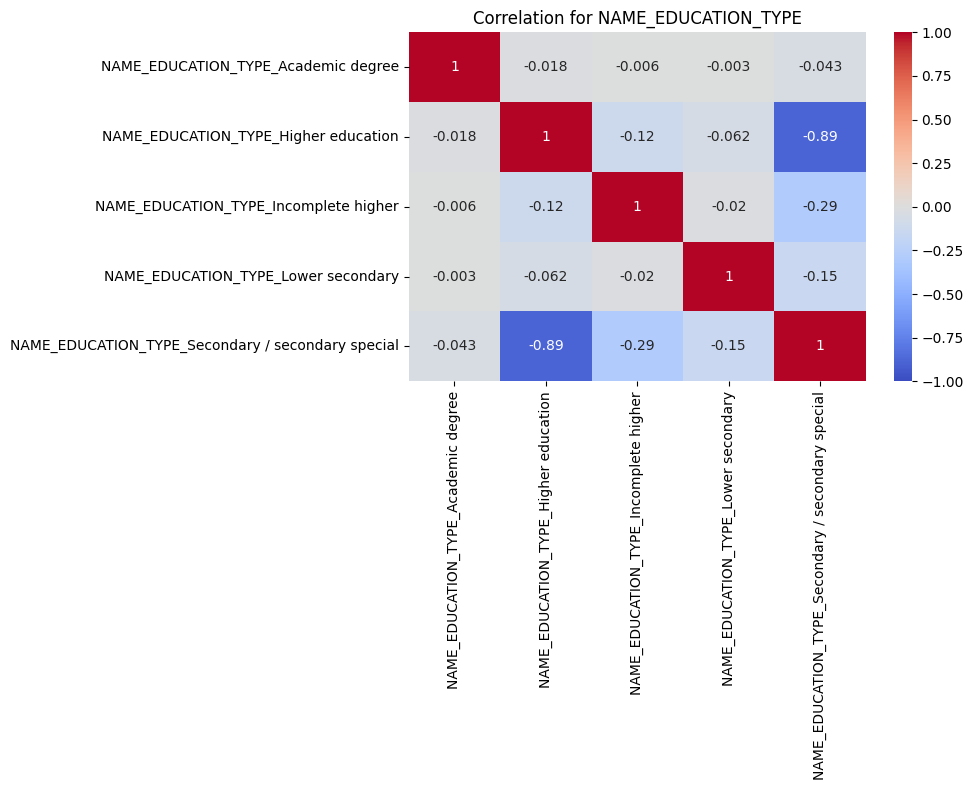

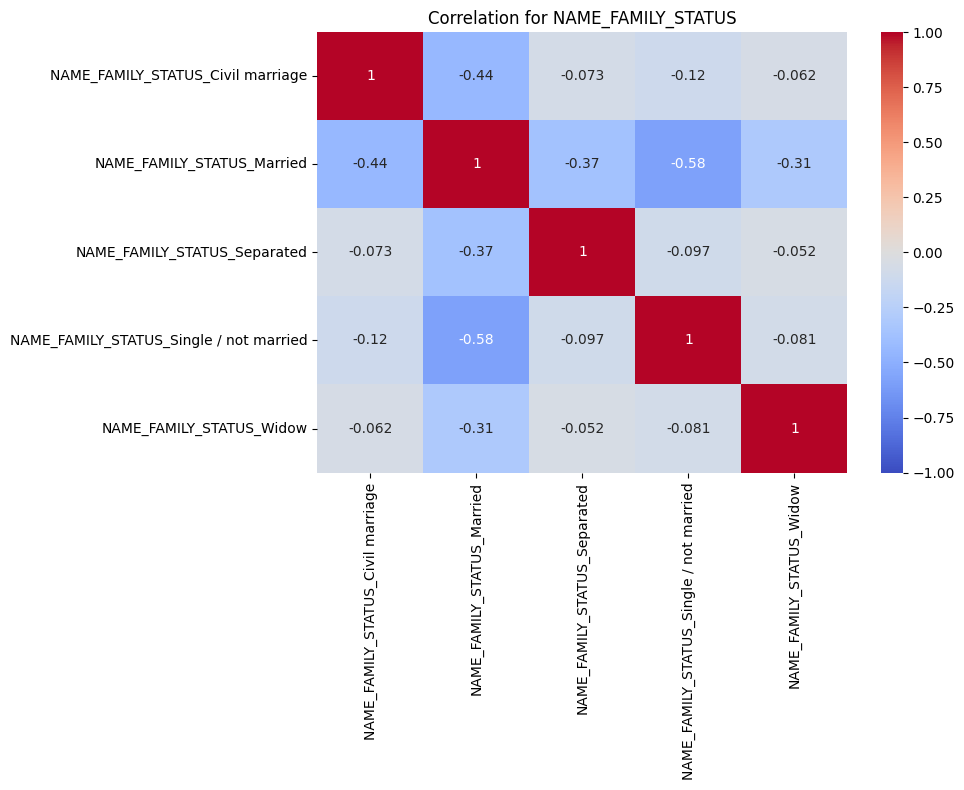

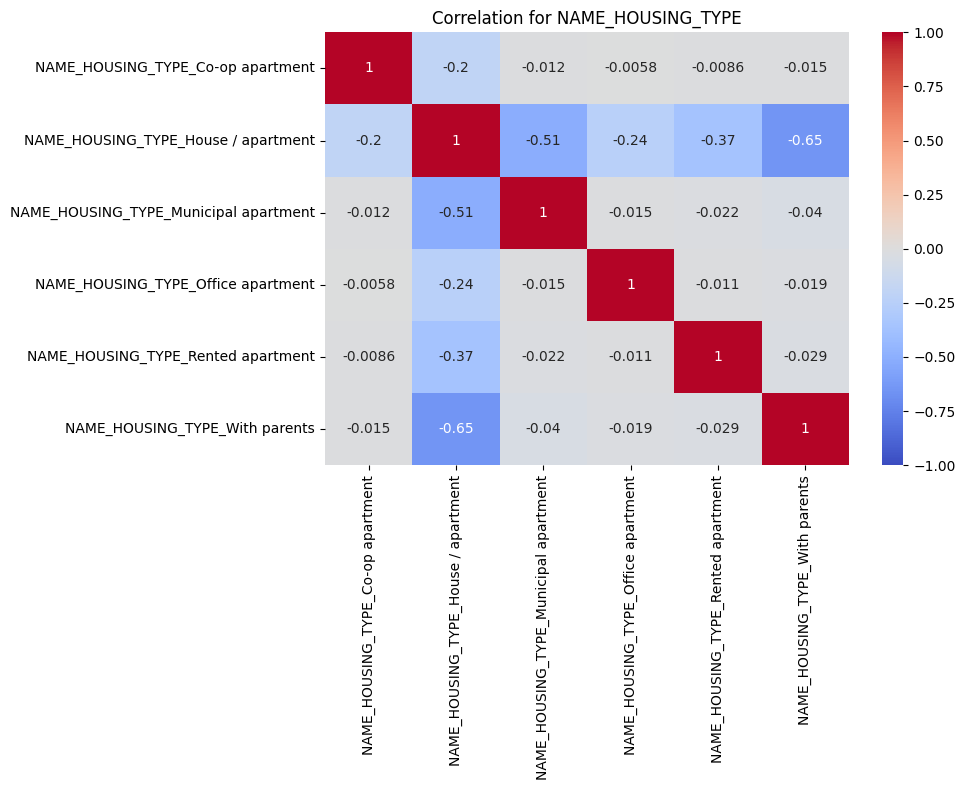

In [ ]:
def plot_categorical_correlations(data, var):
    encoded_columns = [col for col in data.columns if col.startswith(var)]

    corr_matrix = data[encoded_columns].corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
    plt.title(f'Correlation for {var}')
    plt.tight_layout()
    plt.show()

exclude_columns = ['OCCUPATION_TYPE', 'Classification']
for col in categorical_columns:
    if col not in exclude_columns:
        plot_categorical_correlations(df_encoded, col)

In [ ]:
for col in categorical_columns:
      print(df[col].value_counts())
      print()

NAME_INCOME_TYPE
Working                 18644
Commercial associate     8416
Pensioner                6069
State servant            2965
Student                    11
Name: count, dtype: int64

NAME_EDUCATION_TYPE
Secondary / secondary special    24536
Higher education                  9769
Incomplete higher                 1398
Lower secondary                    370
Academic degree                     32
Name: count, dtype: int64

NAME_FAMILY_STATUS
Married                 24837
Single / not married     4760
Civil marriage           2915
Separated                2090
Widow                    1503
Name: count, dtype: int64

NAME_HOUSING_TYPE
House / apartment      32248
With parents            1761
Municipal apartment     1102
Rented apartment         571
Office apartment         257
Co-op apartment          166
Name: count, dtype: int64

OCCUPATION_TYPE
Laborers                 6147
None                     6069
Unknown                  5145
Core staff               3549
Sales staff  

# Feature Engineering

## Feature Engineering on Training Set

Apply these changes to the Training Set:

1) Drop ```CNT_CHILDREN```. For ```CNT_FAM_MEMBERS```, group the values that are >= 5. (Note: values of `CNT_FAM_MEMBERS` that are more than or equals to 5 will be represented as 5)

2) One-hot encoding for ```NAME_INCOME_TYPE```, ```NAME_FAMILY_STATUS```, ```NAME_HOUSING_TYPE```, ```OCCUPATION_TYPE```.

3) Ordinal encoding for ```NAME_EDUCATION_TYPE```: Lower secondary -> Secondary / secondary special -> Incomplete higher -> Higher education -> Academic degree

In [ ]:
# 1. Drop CNT_CHILDREN and group CNT_FAM_MEMBERS
X_train = X_train.drop('CNT_CHILDREN', axis=1)

def group_family_members(x):
    return x if x < 5 else 5

X_train['CNT_FAM_MEMBERS'] = X_train['CNT_FAM_MEMBERS'].apply(group_family_members)

In [ ]:
X_train.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,AGE,EMPLOYMENT_DURATION
14596,1,0,1,112500.0,Working,Higher education,Civil marriage,House / apartment,0.0,0.0,0.0,Security staff,2.0,54,15
13628,1,0,0,190399.5,Commercial associate,Secondary / secondary special,Married,House / apartment,1.0,0.0,0.0,Core staff,2.0,28,3
18521,0,1,1,67500.0,Working,Secondary / secondary special,Married,House / apartment,0.0,1.0,1.0,Laborers,3.0,35,2
1070,1,1,1,252000.0,Working,Secondary / secondary special,Married,House / apartment,0.0,1.0,1.0,Security staff,2.0,60,4
25475,0,0,1,112500.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.0,0.0,0.0,Laborers,1.0,27,2


In [ ]:
# 2. One-hot encoding for specified columns
cols = ['NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE']

onehot_encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
onehot_encoded = onehot_encoder.fit_transform(X_train[cols])

onehot_columns = onehot_encoder.get_feature_names_out(cols)
onehot_X_train = pd.DataFrame(onehot_encoded, columns=onehot_columns, index=X_train.index)

In [ ]:
X_train.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,AGE,EMPLOYMENT_DURATION
14596,1,0,1,112500.0,Working,Higher education,Civil marriage,House / apartment,0.0,0.0,0.0,Security staff,2.0,54,15
13628,1,0,0,190399.5,Commercial associate,Secondary / secondary special,Married,House / apartment,1.0,0.0,0.0,Core staff,2.0,28,3
18521,0,1,1,67500.0,Working,Secondary / secondary special,Married,House / apartment,0.0,1.0,1.0,Laborers,3.0,35,2
1070,1,1,1,252000.0,Working,Secondary / secondary special,Married,House / apartment,0.0,1.0,1.0,Security staff,2.0,60,4
25475,0,0,1,112500.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.0,0.0,0.0,Laborers,1.0,27,2


In [ ]:
# 3. Ordinal encoding for NAME_EDUCATION_TYPE
education_order = ['Lower secondary', 'Secondary / secondary special', 'Incomplete higher', 'Higher education', 'Academic degree']

ordinal_encoder = OrdinalEncoder(categories=[education_order])
X_train['NAME_EDUCATION_TYPE_ORDINAL'] = ordinal_encoder.fit_transform(X_train[['NAME_EDUCATION_TYPE']])

In [ ]:
X_train.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,AGE,EMPLOYMENT_DURATION,NAME_EDUCATION_TYPE_ORDINAL
14596,1,0,1,112500.0,Working,Higher education,Civil marriage,House / apartment,0.0,0.0,0.0,Security staff,2.0,54,15,3.0
13628,1,0,0,190399.5,Commercial associate,Secondary / secondary special,Married,House / apartment,1.0,0.0,0.0,Core staff,2.0,28,3,1.0
18521,0,1,1,67500.0,Working,Secondary / secondary special,Married,House / apartment,0.0,1.0,1.0,Laborers,3.0,35,2,1.0
1070,1,1,1,252000.0,Working,Secondary / secondary special,Married,House / apartment,0.0,1.0,1.0,Security staff,2.0,60,4,1.0
25475,0,0,1,112500.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.0,0.0,0.0,Laborers,1.0,27,2,1.0


In [ ]:
X_train = X_train.drop(columns=cols + ['NAME_EDUCATION_TYPE'])
X_train = pd.concat([X_train, onehot_X_train], axis=1)

In [ ]:
X_train.head()

,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,AMT_INCOME_TOTAL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,AGE,EMPLOYMENT_DURATION,...,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_None,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Unknown,OCCUPATION_TYPE_Waiters/barmen staff
14596,1,0,1,112500.0,0.0,0.0,0.0,2.0,54,15,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
13628,1,0,0,190399.5,1.0,0.0,0.0,2.0,28,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18521,0,1,1,67500.0,0.0,1.0,1.0,3.0,35,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1070,1,1,1,252000.0,0.0,1.0,1.0,2.0,60,4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
25475,0,0,1,112500.0,0.0,0.0,0.0,1.0,27,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Feature Engineering on Testing Set

In [ ]:
# Drop CNT_CHILDREN and group CNT_FAM_MEMBERS
X_test = X_test.drop('CNT_CHILDREN', axis=1)
X_test['CNT_FAM_MEMBERS'] = X_test['CNT_FAM_MEMBERS'].apply(group_family_members)

# 1. One-hot encoding for specified columns
onehot_encoded_test = onehot_encoder.transform(X_test[cols])
onehot_X_test = pd.DataFrame(onehot_encoded_test, columns=onehot_columns, index=X_test.index)

# 2. Ordinal encoding for NAME_EDUCATION_TYPE
X_test['NAME_EDUCATION_TYPE_ORDINAL'] = ordinal_encoder.transform(X_test[['NAME_EDUCATION_TYPE']])

# 3. Drop original columns and concatenate
X_test = X_test.drop(columns=cols + ['NAME_EDUCATION_TYPE'])
X_test = pd.concat([X_test, onehot_X_test], axis=1)

## Identifying Outliers

<Axes: xlabel='AMT_INCOME_TOTAL'>

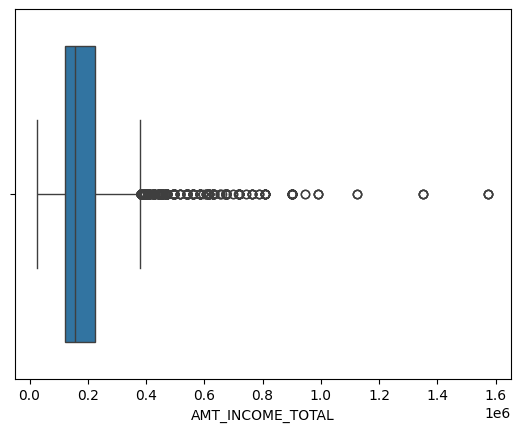

In [ ]:
sns.boxplot(x=X_train['AMT_INCOME_TOTAL'])

From the boxplot above, we notice that there is a significant number of outliers.

We will scale the feature `AMT_INCOME_TOTAL` on train and test datasets with StandardScaler to help reduce the impact of outliers and improve model performance later when applying PCA for dimensionality reduction.

# Identifying Imbalanced Data Proportion

Classification
1    35612
0      493
Name: count, dtype: int64
(36105, 17)


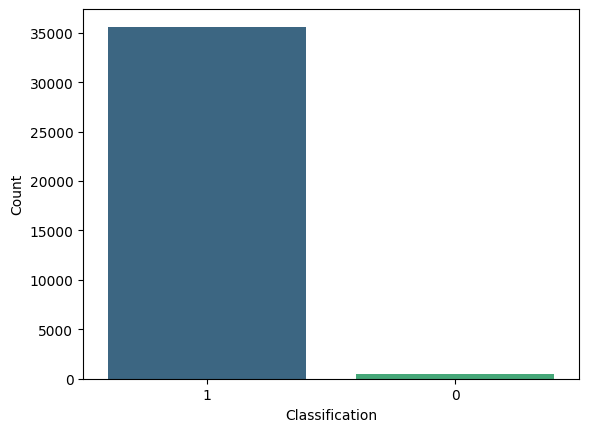

In [ ]:
count = df['Classification'].value_counts()
print(count)
print(df.shape)

fig = sns.barplot(x=count.index, y=count.values, hue = count.index, palette='viridis').set(xlabel='Classification', ylabel='Count')

There is a huge data imbalance, with 35,901 good clients (1) and only 556 bad clients (0).

# Prepare Data for Training of Models (Baseline Evaluation)

## Apply SMOTE-NC to handle Imbalanced Data
Considering the extreme imbalance (35901:556), we consider SMOTE-NC (applying on train data only).

In [ ]:
# Specifying the indices of categorical columns
categorical_features = [0, 1, 2, 4, 5, 6, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
                        27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]

# Apply SMOTE-NC
smote_nc = SMOTENC(categorical_features=categorical_features, random_state=42)
X_train_res, y_train_res = smote_nc.fit_resample(X_train, y_train)

# Convert back to dataframe
X_train_res = pd.DataFrame(X_train_res, columns=X_train.columns)
y_train_res = pd.Series(y_train_res)

Visualise the Distribution after SMOTE-NC.

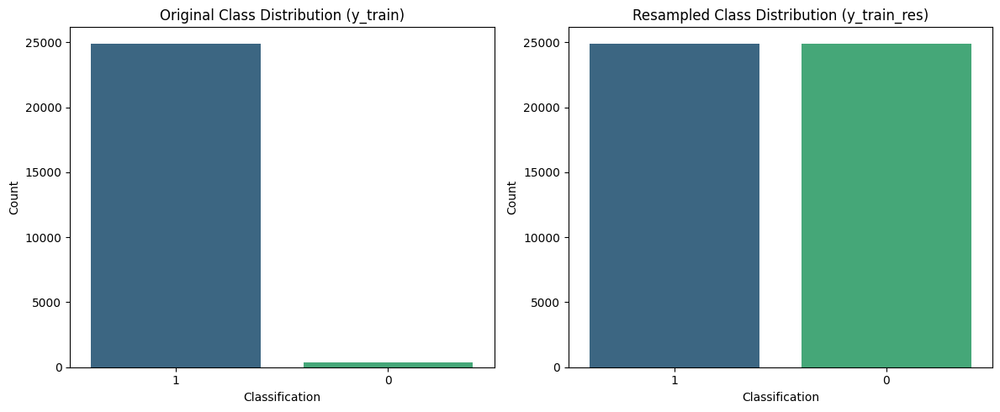

In [ ]:
# Plot original class distribution before SMOTE-NC
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
count_original = y_train.value_counts()
sns.barplot(x=count_original.index, y=count_original.values,hue = count.index, palette='viridis')
plt.title('Original Class Distribution (y_train)')
plt.xlabel('Classification')
plt.ylabel('Count')

# Plot resampled class distribution
plt.subplot(1, 2, 2)
count_resampled = y_train_res.value_counts()
sns.barplot(x=count_resampled.index, y=count_resampled.values,hue = count.index, palette='viridis')
plt.title('Resampled Class Distribution (y_train_res)')
plt.xlabel('Classification')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

In [ ]:
print("Number of datapoints before SMOTE-NC: ", X_train.shape[0],
      "\nNumber of datapoints after SMOTE-NC: ", X_train_res.shape[0])

Number of datapoints before SMOTE-NC:  25273 
Number of datapoints after SMOTE-NC:  49856


## PCA for Dimensionality

### Feature Scaling

In [ ]:
sc = StandardScaler()
X_train_res_scaled = sc.fit_transform(X_train_res)
X_test_scaled = sc.transform(X_test)

### Apply PCA
We plot the explained variance ratio to visalise how much variance each component contributes to total variance in the data. This helps us to reduce dimensionality as we can select the most important features that explain the majority of the variance while ignoring the less significant ones.

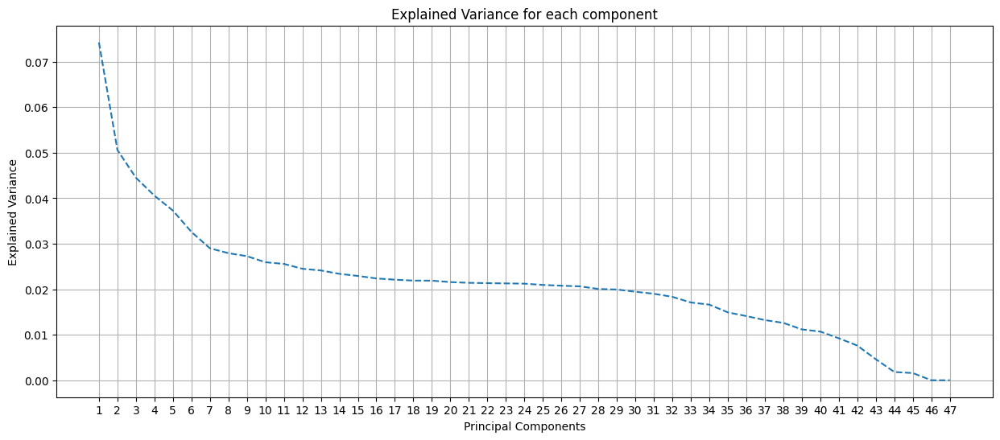

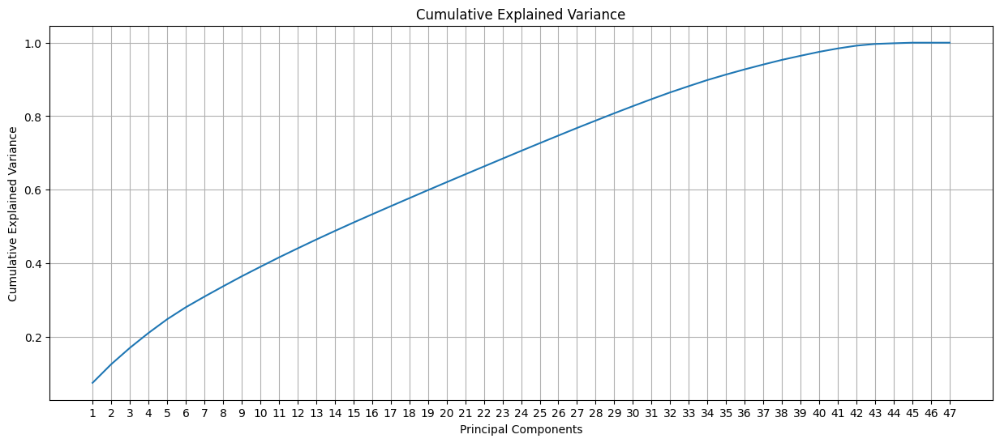

In [ ]:
pca = PCA()
X_pca = pca.fit_transform(X_train_res_scaled)

explained_variance = pca.explained_variance_ratio_

# Visualise Explained Variance Ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot explained variance (Scree Plot)
plt.figure(figsize=(15,6))
explained_variance = explained_variance_ratio
plt.plot(range(1, len(explained_variance) + 1), explained_variance, linestyle='--', label='Explained Variance')
plt.title('Explained Variance for each component')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance')
plt.xticks(range(1, len(explained_variance) + 1))
plt.grid(True)
plt.show()

# Plot cumulative explained variance
plt.figure(figsize=(15,6))
cumulative_explained_variance = np.cumsum(explained_variance_ratio)
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, linestyle='-', label='Cumulative Explained Variance')
plt.title('Cumulative Explained Variance')
plt.xlabel('Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_explained_variance) + 1))
plt.grid(True)
plt.show()

# Choose a number of components that explain enough variance - select 80% in this case
pca = PCA(n_components=0.8)
X_train_pca = pca.fit_transform(X_train_res_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Standardise naming
y_train_pca = y_train_res

In [ ]:
print("Number of features before PCA: ", X_train_res_scaled.shape[1],
      "\nNumber of features after PCA: ", X_train_pca.shape[1])

Number of features before PCA:  47 
Number of features after PCA:  29


# Training Models (Baseline Evaluation)

## Decision Tree

In [ ]:
# Initialise the Model
DT_model = DecisionTreeClassifier(random_state=42)

# Train the Model
DT_model.fit(X_train_pca, y_train_pca)
y_pred_DT = DT_model.predict(X_test_pca)

### Model Evaluation

In [ ]:
# Evaluate the Model
accuracy_DT = accuracy_score(y_test, y_pred_DT)
precision_DT = precision_score(y_test, y_pred_DT, pos_label = '1')
recall_DT = recall_score(y_test, y_pred_DT, pos_label = '1')
f1_score_DT = f1_score(y_test, y_pred_DT, pos_label = '1')
conf_matrix_DT = confusion_matrix(y_test, y_pred_DT)
class_matrix_DT = classification_report(y_test, y_pred_DT)
roc_auc_DT = roc_auc_score(y_test, DT_model.predict_proba(X_test_pca)[:, 1])


print("Decision Tree Baseline Evaluation", "\n",
      "\n Confusion Matrix", "\n", conf_matrix_DT, "\n",
      "\n Classification Report", "\n", class_matrix_DT)

Decision Tree Baseline Evaluation 
 
 Confusion Matrix 
 [[   33   115]
 [  147 10537]] 
 
 Classification Report 
               precision    recall  f1-score   support

           0       0.18      0.22      0.20       148
           1       0.99      0.99      0.99     10684

    accuracy                           0.98     10832
   macro avg       0.59      0.60      0.59     10832
weighted avg       0.98      0.98      0.98     10832



On a microscopic level, the performance of decision tree in predicting good clients was spectacular, with precision, recall, and F1-score all at 0.99. However, the model had difficulties predicting bad clients, as the results for the same metrics are all under 0.25.

As a result, the macro-average of precision, recall, and f1-score are all slightly over 0.60.

This could be due to the huge imbalance in data, resulting in the model not being able to learn how to predict bad clients well.

### Display ROC-AUC Curve for Decision Tree

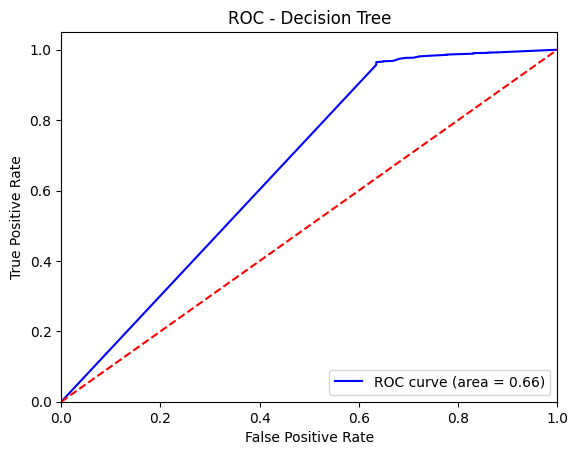

In [ ]:
# Calculate the ROC curve
y_test_numeric = y_test.astype(int)
fpr_logistic, tpr_logistic, _ = roc_curve(y_test_numeric, DT_model.predict_proba(X_test_pca)[:, 1])

# Plot the AUC-ROC Curve
plt.figure()
plt.plot(fpr_logistic, tpr_logistic, color='blue', label='ROC curve (area = {:.2f})'.format(roc_auc_DT))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Decision Tree')
plt.legend(loc='lower right')
plt.show()

## Random Forest

In [ ]:
# Initialise the Model
RF_model = RandomForestClassifier(random_state = 42)

# Train the Model
RF_model.fit(X_train_pca, y_train_pca)
y_pred_RF = DT_model.predict(X_test_pca)

### Model Evaluation

In [ ]:
# Evaluate the Model
accuracy_RF = accuracy_score(y_test, y_pred_RF)
precision_RF = precision_score(y_test, y_pred_RF, pos_label = '1')
recall_RF = recall_score(y_test, y_pred_RF, pos_label = '1')
f1_score_RF = f1_score(y_test, y_pred_RF, pos_label = '1')
conf_matrix_RF = confusion_matrix(y_test, y_pred_RF)
class_matrix_RF = classification_report(y_test, y_pred_RF)
roc_auc_RF = roc_auc_score(y_test, RF_model.predict_proba(X_test_pca)[:, 1])


print("Random Forest Baseline Evaluation", "\n",
      "\n Confusion Matrix", "\n", conf_matrix_RF, "\n",
      "\n Classification Report", "\n", class_matrix_RF)

Random Forest Baseline Evaluation 
 
 Confusion Matrix 
 [[   33   115]
 [  147 10537]] 
 
 Classification Report 
               precision    recall  f1-score   support

           0       0.18      0.22      0.20       148
           1       0.99      0.99      0.99     10684

    accuracy                           0.98     10832
   macro avg       0.59      0.60      0.59     10832
weighted avg       0.98      0.98      0.98     10832



Similar to the performance of Baseline Decision Tree, the model could predict good clients very well but struggled at predicting bad clients, as seen in the metrics at the microscopic level.

As a result, the macro-average results for precision, recall, and F1-score were all around 0.60.

This could be due to the huge imbalance in data, resulting in the model not being able to learn how to predict bad clients well.

### Display ROC-AUC Curve for Random Forest

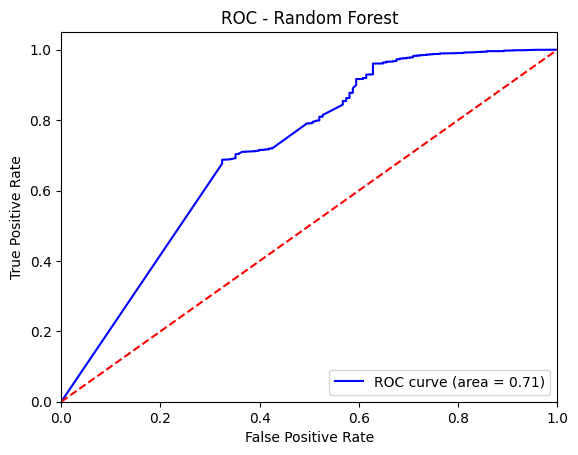

In [ ]:
# Calculate the ROC curve
y_test_numeric = y_test.astype(int)
fpr_logistic, tpr_logistic, _ = roc_curve(y_test_numeric, RF_model.predict_proba(X_test_pca)[:, 1])

# Plot the AUC-ROC Curve
plt.figure()
plt.plot(fpr_logistic, tpr_logistic, color='blue', label='ROC curve (area = {:.2f})'.format(roc_auc_RF))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Random Forest')
plt.legend(loc='lower right')
plt.show()

## Logistic Regression

In [ ]:
# Initialise the Model
LR_model = LogisticRegression(random_state = 42)

# Train the Model
LR_model.fit(X_train_pca, y_train_res)
y_pred_LR = LR_model.predict(X_test_pca)

### Model Evaluation

In [ ]:
# Evaluate the Model
accuracy_LR = accuracy_score(y_test, y_pred_LR)
precision_LR = precision_score(y_test, y_pred_LR, pos_label = '1')
recall_LR = recall_score(y_test, y_pred_LR, pos_label = '1')
f1_score_LR = f1_score(y_test, y_pred_LR, pos_label = '1')
conf_matrix_LR = confusion_matrix(y_test, y_pred_LR)
class_matrix_LR = classification_report(y_test, y_pred_LR)
roc_auc_LR = roc_auc_score(y_test, LR_model.predict_proba(X_test_pca)[:, 1])


print("Logistic Regression Baseline Evaluation", "\n",
      "\n Confusion Matrix", "\n", conf_matrix_LR, "\n",
      "\n Classification Report", "\n", class_matrix_LR)

Logistic Regression Baseline Evaluation 
 
 Confusion Matrix 
 [[  45  103]
 [3886 6798]] 
 
 Classification Report 
               precision    recall  f1-score   support

           0       0.01      0.30      0.02       148
           1       0.99      0.64      0.77     10684

    accuracy                           0.63     10832
   macro avg       0.50      0.47      0.40     10832
weighted avg       0.97      0.63      0.76     10832



On a microscopic level, correct prediction of good clients was not great, as seen in the score of 0.64 for recall. Additionally, the performance for prediction of bad clients was not great as well, as seen in the low scores in the classification report.

As a result, macro-average scores did not perform well.

This could be due to the huge imbalance in data, resulting in the model not being able to learn how to predict bad clients well. Furthermore, logistic regression is not the best at capturing complex and non-linear patterns in data, which could have worsened the overall performance as compared to Decision Tree and Random Forest.

### Display AUC-ROC for Logistic Regression

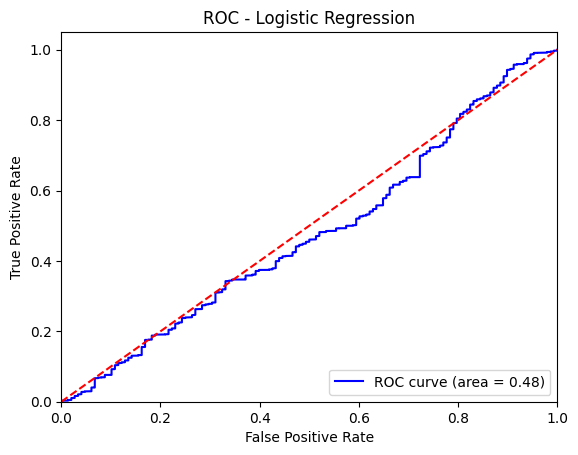

In [ ]:
# Calculate the ROC curve
y_test_numeric = y_test.astype(int)
fpr_logistic, tpr_logistic, _ = roc_curve(y_test_numeric, LR_model.predict_proba(X_test_pca)[:, 1])

# Plot the AUC-ROC Curve
plt.figure()
plt.plot(fpr_logistic, tpr_logistic, color='blue', label='ROC curve (area = {:.2f})'.format(roc_auc_LR))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Logistic Regression')
plt.legend(loc='lower right')
plt.show()

# Optimise Models (Hyperparameter Tuning)

## Decision Tree

### SMOTE-NC, PCA NOT applied to each fold
- use GridSearchCV for hyperparameter tuning

In [ ]:
# Set a range of hyperparameters to tune the model
hyperparam_grid_DT = {
    'max_depth': [10, 15, 20, None],   # higher val -> deeper tree
    'min_samples_split': [2, 5, 10, 15],   # higher val -> simpler tree (less overfitting)
    'min_samples_leaf': [2, 5, 10],    # higher val -> simpler tree
    'criterion': ['gini', 'entropy'],
    'max_features': [None, 'sqrt', 'log2']
}

# Implement GridSearchCV to optimise the Decision Tree
DT_model_opt = DecisionTreeClassifier(random_state = 42)
DT_model_grid = GridSearchCV(estimator = DT_model_opt, param_grid = hyperparam_grid_DT, cv=5, scoring = 'recall_macro', n_jobs=-1, verbose=1)

# Fit the model on every combination of hyperparameters listed in hyperparam_grid_DT
DT_model_grid.fit(X_train_pca, y_train_pca)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 15, 20, None],
                         'max_features': [None, 'sqrt', 'log2'],
                         'min_samples_leaf': [2, 5, 10],
                         'min_samples_split': [2, 5, 10, 15]},
             scoring='recall_macro', verbose=1)

In [ ]:
# Select best Decision Tree with optimised Hyperparameters
best_DT_model = DT_model_grid.best_estimator_

best_hyperparam_DT = DT_model_grid.best_params_
print("Best Hyperparameters: ", best_hyperparam_DT)

Best Hyperparameters:  {'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 10}


[[   29   119]
 [  162 10522]]
              precision    recall  f1-score   support

           0       0.15      0.20      0.17       148
           1       0.99      0.98      0.99     10684

    accuracy                           0.97     10832
   macro avg       0.57      0.59      0.58     10832
weighted avg       0.98      0.97      0.98     10832



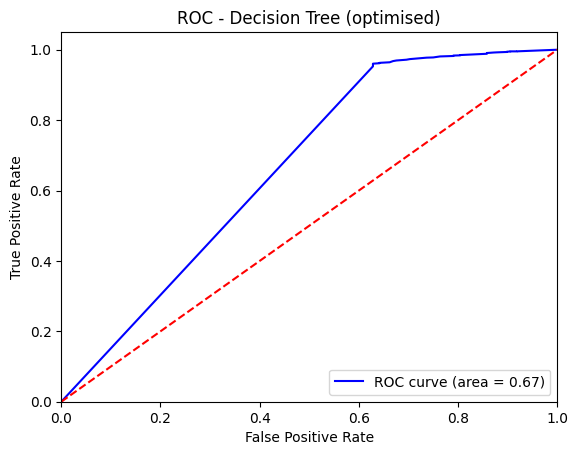

In [ ]:
# Train optimised Decision Tree with entire Train Set
opt_DT_model = DecisionTreeClassifier(criterion = 'entropy', max_depth = None, max_features = None, min_samples_leaf = 2, min_samples_split = 10, random_state = 42)
opt_DT_model.fit(X_train_pca, y_train_pca)

# Evaluate optimised Decision Tree Model on Test Set
y_pred_DT_opt = opt_DT_model.predict(X_test_pca)
conf_matrix_DT_opt = confusion_matrix(y_test, y_pred_DT_opt)

print("Optimised Decision Tree Evaluation", "\n",
      "\n Confusion Matrix", "\n", conf_matrix_DT_opt, "\n",
      "\n Classification Report", "\n", classification_report(y_test, y_pred_DT_opt))

# Calculate the ROC curve
y_test_numeric = y_test.astype(int)
fpr_logistic, tpr_logistic, _ = roc_curve(y_test_numeric, opt_DT_model.predict_proba(X_test_pca)[:, 1])
roc_auc_DT_opt = roc_auc_score(y_test, opt_DT_model.predict_proba(X_test_pca)[:, 1])

# Plot the AUC-ROC Curve
plt.figure()
plt.plot(fpr_logistic, tpr_logistic, color='blue', label='ROC curve (area = {:.2f})'.format(roc_auc_DT_opt))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Decision Tree (optimised)')
plt.legend(loc='lower right')
plt.show()

## Random Forest

### SMOTE-NC, PCA NOT applied to each fold (Prof Suggestion)
- use GridSearchCV for hyperparameter Tuning

In [ ]:
# Set a range of hyperparameters to tune the model
hyperparam_grid_RF = {
    'n_estimators': [100, 200, 300],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [None, 10, 20, 30]
}

# Implement GridSearchCV to optimise the Random Forest
RF_model_opt = RandomForestClassifier(random_state = 42)
RF_model_grid = GridSearchCV(estimator = RF_model_opt, param_grid = hyperparam_grid_RF, cv=5, scoring = 'recall_macro', n_jobs=-1, verbose=1)

# Fit the model on every combination of hyperparameters listed in hyperparam_grid_RF
RF_model_grid.fit(X_train_pca, y_train_pca)

NameError: name 'RandomForestClassifier' is not defined

In [ ]:
# Select best Random Forest with optimised Hyperparameters
best_RF_model = RF_model_grid.best_estimator_

best_hyperparam_RF = RF_model_grid.best_params_
print("Best Hyperparameters: ", best_hyperparam_RF)

[[   24   124]
 [   70 10614]]
              precision    recall  f1-score   support

           0       0.26      0.16      0.20       148
           1       0.99      0.99      0.99     10684

    accuracy                           0.98     10832
   macro avg       0.62      0.58      0.59     10832
weighted avg       0.98      0.98      0.98     10832



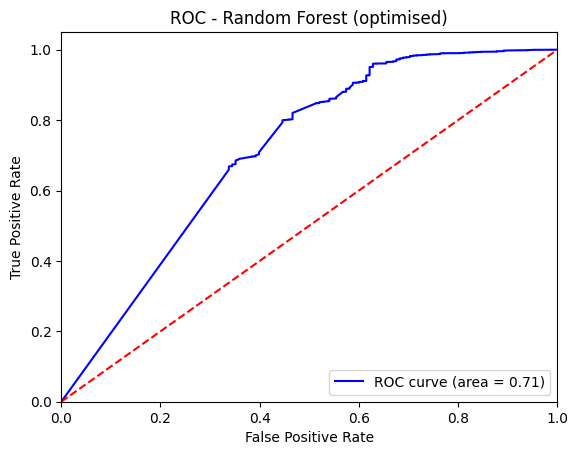

In [ ]:
# Train optimised Random Forest with entire Train Set
opt_RF_model = RandomForestClassifier(n_estimators = 100, max_features = 'log2', max_depth = None, random_state = 42)
opt_RF_model.fit(X_train_pca, y_train_pca)

# Evaluate optimised Random Forest Model on Test Set
y_pred_RF_opt = opt_RF_model.predict(X_test_pca)
conf_matrix_RF_opt = confusion_matrix(y_test, y_pred_RF_opt)

print("Optimised Random Forest Evaluation", "\n",
      "\n Confusion Matrix", "\n", conf_matrix_RF_opt, "\n",
      "\n Classification Report", "\n", classification_report(y_test, y_pred_RF_opt))

# Calculate the ROC curve
y_test_numeric = y_test.astype(int)
fpr_logistic, tpr_logistic, _ = roc_curve(y_test_numeric, opt_RF_model.predict_proba(X_test_pca)[:, 1])
roc_auc_RF_opt = roc_auc_score(y_test, opt_RF_model.predict_proba(X_test_pca)[:, 1])

# Plot the AUC-ROC Curve
plt.figure()
plt.plot(fpr_logistic, tpr_logistic, color='blue', label='ROC curve (area = {:.2f})'.format(roc_auc_RF_opt))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Random Forest (optimised)')
plt.legend(loc='lower right')
plt.show()

## Logistic Regression

### SMOTE-NC, PCA NOT applied to each fold (Prof Suggestion)
- use GridSearchCV for hyperparameter Tuning

In [ ]:
# Set a range of hyperparameters to tune the model
hyperparam_grid_LR = {
    'C': [0.01, 0.1, 1, 10, 100],
    'penalty': ['l1', 'l2', 'elasticnet', None],
    'solver': ['liblinear', 'saga', 'lbfgs', 'newton-cg'],
    'max_iter': [100,1000,2500,5000]
    }

# Implement GridSearchCV to optimise the Logistic Regression model
LR_model_opt = LogisticRegression(random_state = 42)
LR_model_grid = GridSearchCV(estimator = LR_model_opt, param_grid = hyperparam_grid_LR, cv=5, scoring = 'recall_macro', n_jobs=-1, verbose=1)

# Fit the model on every combination of hyperparameters listed in hyperparam_grid_LR
LR_model_grid.fit(X_train_pca, y_train_pca)

Fitting 5 folds for each of 320 candidates, totalling 1600 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
700 fits failed out of a total of 1600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
100 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1194, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File 

GridSearchCV(cv=5, estimator=LogisticRegression(random_state=42), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'max_iter': [100, 1000, 2500, 5000],
                         'penalty': ['l1', 'l2', 'elasticnet', None],
                         'solver': ['liblinear', 'saga', 'lbfgs', 'newton-cg']},
             scoring='recall_macro', verbose=1)

In [ ]:
# Select best Logistic Regression with optimised Hyperparameters
best_LR_model = LR_model_grid.best_estimator_

best_hyperparam_LR = LR_model_grid.best_params_
print("Best Hyperparameters: ", best_hyperparam_LR)

Best Hyperparameters:  {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}


[[  45  103]
 [3896 6788]]
              precision    recall  f1-score   support

           0       0.01      0.30      0.02       148
           1       0.99      0.64      0.77     10684

    accuracy                           0.63     10832
   macro avg       0.50      0.47      0.40     10832
weighted avg       0.97      0.63      0.76     10832



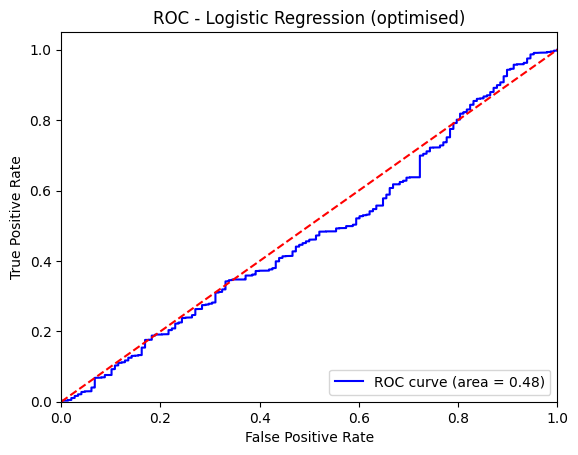

In [ ]:
# Train optimised Logistic Regression with entire Train Set
opt_LR_model = LogisticRegression(C = 1, penalty = 'l2', max_iter = 100, solver = 'liblinear')
opt_LR_model.fit(X_train_pca, y_train_pca)

# Evaluate optimised Logistic Regression Model on Test Set
y_pred_LR_opt = opt_LR_model.predict(X_test_pca)
conf_matrix_LR_opt = confusion_matrix(y_test, y_pred_LR_opt)

print("Optimised Logistic Regression Evaluation", "\n",
      "\n Confusion Matrix", "\n", conf_matrix_LR_opt, "\n",
      "\n Classification Report", "\n", classification_report(y_test, y_pred_LR_opt))

# Calculate the ROC curve
y_test_numeric = y_test.astype(int)
fpr_logistic, tpr_logistic, _ = roc_curve(y_test_numeric, opt_LR_model.predict_proba(X_test_pca)[:, 1])
roc_auc_LR_opt = roc_auc_score(y_test, opt_LR_model.predict_proba(X_test_pca)[:, 1])

# Plot the AUC-ROC Curve
plt.figure()
plt.plot(fpr_logistic, tpr_logistic, color='blue', label='ROC curve (area = {:.2f})'.format(roc_auc_LR_opt))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Logistic Regression (optimised)')
plt.legend(loc='lower right')
plt.show()

# Microscopic Evaluation of Models
## LIME (Local Interpretable Model-agnostic Explanations)

Build a LIME (Local Interpretable Model-agnostic Explanations) Explainer to understand specific classification vs. misclassification instances by the different models.

We consider positive label to take on the status '1' (application approved) and negative label to take on status '0' (application rejected).

Using the LIME Explainer, we will compare a specific instance of misclassification of negative label, in specific, False Positives, against a specific instance of accurate classification of negative label, True Negatives. The reason why we focus on the accuracy of classification of the negative label (status = '0') is because it is costly for banks to misclassify an applicant with high risk of defaulting, compared to misclassifying an applicant with high risk of non-default.

In [ ]:
# Create a LIME Explainer
explainer = LimeTabularExplainer(
    training_data=X_train_pca,
    training_labels=y_train_pca,
    feature_names=[f'PC{i+1}' for i in range(X_train_pca.shape[1])],
    class_names=[0, 1],
    mode='classification'
)

#### Relationship between Principal Components and Original Features

The purpose of doing this is to understand how original features affect classification decisions in the next few sections.

In [ ]:
# Understand the contributions of the original features to the principal components
original_feature_names = list(X_train.columns)
pca_feature_names = [f'PC{i+1}' for i in range(X_train_pca.shape[1])]
pca_loadings = pd.DataFrame(pca.components_, columns = original_feature_names, index = pca_feature_names)


## For Decision Trees

### False Positive Instance - Misclassification of Status '0'

In [ ]:
np.random.seed(42)

# Select an instance for False Positive for Decision Tree Baseline Model
false_positives_DT = np.where((y_test =='0') & (y_pred_DT== '1'))[0]
print(f"False Positive Indices: {false_positives_DT}")

# Randomly select an instance of False Positive
random_instance_FP_DT = np.random.choice(false_positives_DT)
FP_DT_to_explain = X_test_pca[random_instance_FP_DT]
print(f"Random Instance of False Positive: {random_instance_FP_DT}")

# Explain the instance of False Positive
explanation_FP_DT = explainer.explain_instance(
    data_row = FP_DT_to_explain,
    predict_fn = DT_model.predict_proba,   # Model Prediction Function for LIME
    num_features = 5                       # Number of Features to display in the explanation. In this case, it refers to the number of Principal Components
)

# Show Explanation
explanation_FP_DT.show_in_notebook(show_table = True)

False Positive Indices: [   58   150   183   349   376   388   507   626   628   837  1092  1139
  1192  1214  1230  1278  1295  1378  1456  1577  1628  1842  1935  1957
  1969  2017  2077  2149  2161  2218  2394  2453  2478  2486  2767  2841
  2862  2960  3004  3130  3144  3155  3387  3526  3527  3606  3657  3684
  3779  3854  4057  4311  4432  4446  4694  4786  4856  4966  4968  4981
  5040  5121  5129  5162  5204  5225  5242  5357  5432  5445  5477  5779
  5820  5855  5903  5921  5957  6009  6095  6718  6842  6853  6889  6919
  7019  7023  7093  7110  7265  7290  7555  7990  7992  8101  8238  8398
  8408  8437  8562  8696  8778  8883  9175  9276  9280  9564  9611  9614
  9672  9935 10010 10011 10217 10374 10547]
Random Instance of False Positive: 9175


From the top 5 Principal Components which contributes to the randomly chosen instance #9175, a False Positive Case, we map these 5 PCs, weighted by their LIME feature values to the different Original Features that make up the Principal Components, in order to compute the top 10 Features of the Dataset which contributes the most to

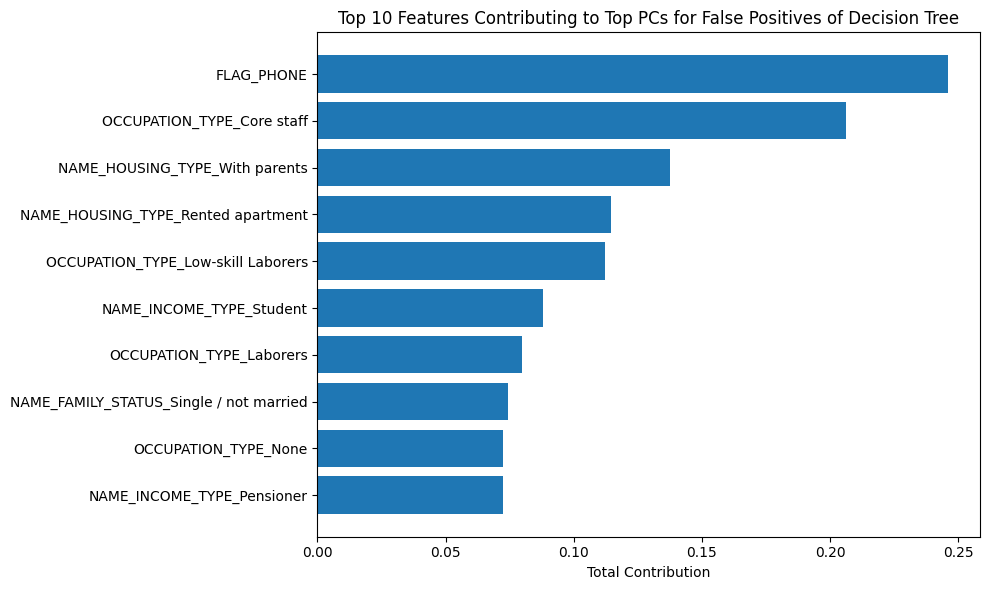

In [ ]:
top_pcs_FP_DT = [26, 8, 21, 18, 17]
lime_weights_FP_DT = [-0.15, -0.52, 0.22, -0.50, -0.14]
features = X_train.columns

# Calculate feature contributions for each top Principal Component
contributions_FP_DT = np.zeros((len(features), len(top_pcs_FP_DT)))
for i, pc in enumerate(top_pcs_FP_DT):
  for j, feature in enumerate(features):
    contributions_FP_DT[j, i] = pca_loadings.iloc[pc, j] * lime_weights_FP_DT[i]

# Sum the contributions for each feature across all PCs
total_contributions_FP_DT = contributions_FP_DT.sum(axis = 1)

# Create a DataFrame to see the contributions for each feature
contribution_FP_DT_df = pd.DataFrame({
    'Feature': features,
    'Total Contribution': total_contributions_FP_DT
})

# Sort the features based on total contribution in descending order
contribution_FP_DT_df = contribution_FP_DT_df.sort_values(by = "Total Contribution", ascending = False)

# Display top 10 features
top_10_features_FP_DT = contribution_FP_DT_df.head(10)

# Plot the top 10 features' contributions
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(top_10_features_FP_DT['Feature'], top_10_features_FP_DT['Total Contribution'])
ax.set_xlabel('Total Contribution')
ax.set_title('Top 10 Features Contributing to Top PCs for False Positives of Decision Tree')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

### True Negative Instance - Correct Classification of Status '0'

In [ ]:
np.random.seed(42)

# Select an instance of True Negative for Decision Tree Baseline Model
true_negatives_DT = np.where((y_test == '0') & (y_pred_DT == '0'))[0]
print(f"True Negative Indices: {true_negatives_DT}")

# Randomly select an instance of True Negative
random_instance_TN_DT = np.random.choice(true_negatives_DT)
TN_DT_to_explain = X_test_pca[random_instance_TN_DT]
print(f"Random Instance of True Negative: {random_instance_TN_DT}")

# Explain the instance of False Positive
explanation_TN_DT = explainer.explain_instance(
    data_row = TN_DT_to_explain,
    predict_fn = DT_model.predict_proba,   # Model Prediction Function for LIME
    num_features = 5                       # Number of Features to display in the explanation. In this case, it refers to the number of Principal Components
)

# Show Explanation
explanation_TN_DT.show_in_notebook(show_table = True)

True Negative Indices: [  407  1265  1469  1631  1685  1779  1798  2241  2498  2542  2605  2634
  2829  2870  2900  3291  4011  4223  5032  5234  6359  7651  7763  8016
  8467  8985  8986  9008  9293 10265 10319 10482 10755]
Random Instance of True Negative: 9293


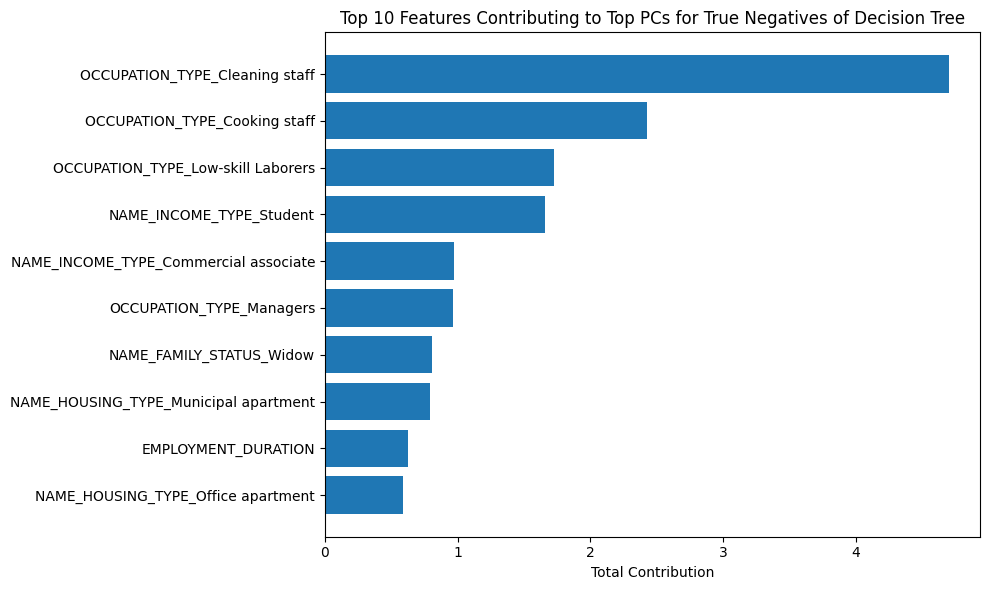

In [ ]:
top_pcs_TN_DT = [8, 20, 16, 14, 27]
lime_weights_TN_DT = [2.26, -4.88, -1.89, -3.17, -3.53]
features = X_train.columns

# Calculate feature contributions for each top Principal Component
contributions_TN_DT = np.zeros((len(features), len(top_pcs_TN_DT)))
for i, pc in enumerate(top_pcs_TN_DT):
  for j, feature in enumerate(features):
    contributions_TN_DT[j, i] = pca_loadings.iloc[pc, j] * lime_weights_TN_DT[i]

# Sum the contributions for each feature across all PCs
total_contributions_TN_DT = contributions_TN_DT.sum(axis = 1)

# Create a DataFrame to see the contributions for each feature
contribution_TN_DT_df = pd.DataFrame({
    'Feature': features,
    'Total Contribution': total_contributions_TN_DT
})

# Sort the features based on total contribution in descending order
contribution_TN_DT_df = contribution_TN_DT_df.sort_values(by = "Total Contribution", ascending = False)

# Display top 10 features
top_10_features_TN_DT = contribution_TN_DT_df.head(10)

# Plot the top 10 features' contributions
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(top_10_features_TN_DT['Feature'], top_10_features_TN_DT['Total Contribution'])
ax.set_xlabel('Total Contribution')
ax.set_title('Top 10 Features Contributing to Top PCs for True Negatives of Decision Tree')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

## Random Forests

### False Positive Instance - Misclassification of Status '0'

In [ ]:
np.random.seed(42)

# Select an instance for False Positive for Random Forests Baseline Model
false_positives_RF = np.where((y_test =='0') & (y_pred_RF== '1'))[0]
print(f"False Positive Indices: {false_positives_RF}")

# Randomly select an instance of False Positive
random_instance_FP_RF = np.random.choice(false_positives_RF)
FP_RF_to_explain = X_test_pca[random_instance_FP_RF]
print(f"Random Instance of False Positive: {random_instance_FP_RF}")

# Explain the instance of False Positive
explanation_FP_RF = explainer.explain_instance(
    data_row = FP_RF_to_explain,
    predict_fn = RF_model.predict_proba,   # Model Prediction Function for LIME
    num_features = 5                       # Number of Features to display in the explanation. In this case, it refers to the number of Principal Components
)

# Show Explanation
explanation_FP_RF.show_in_notebook(show_table = True)

False Positive Indices: [   58   150   183   349   376   388   507   626   628   837  1092  1139
  1192  1214  1230  1278  1295  1378  1456  1577  1628  1842  1935  1957
  1969  2017  2077  2149  2161  2218  2394  2453  2478  2486  2767  2841
  2862  2960  3004  3130  3144  3155  3387  3526  3527  3606  3657  3684
  3779  3854  4057  4311  4432  4446  4694  4786  4856  4966  4968  4981
  5040  5121  5129  5162  5204  5225  5242  5357  5432  5445  5477  5779
  5820  5855  5903  5921  5957  6009  6095  6718  6842  6853  6889  6919
  7019  7023  7093  7110  7265  7290  7555  7990  7992  8101  8238  8398
  8408  8437  8562  8696  8778  8883  9175  9276  9280  9564  9611  9614
  9672  9935 10010 10011 10217 10374 10547]
Random Instance of False Positive: 9175


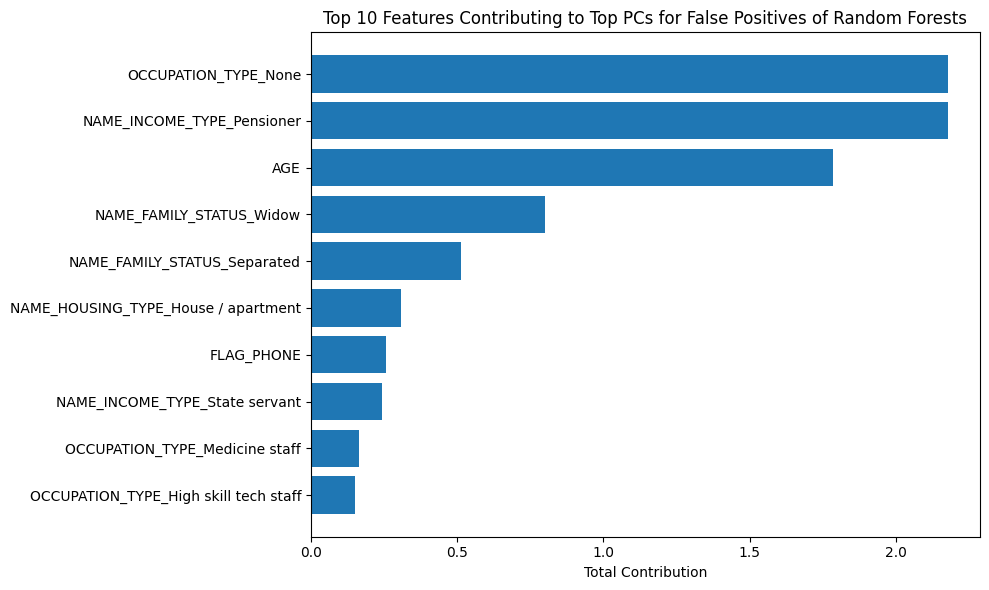

In [ ]:
top_pcs_FP_RF = [6, 4, 16, 26, 0]
lime_weights_FP_RF = [0.87, 0.61, -0.05, -0.15, 4.38]
features = X_train.columns

# Calculate feature contributions for each top Principal Component
contributions_FP_RF = np.zeros((len(features), len(top_pcs_FP_RF)))
for i, pc in enumerate(top_pcs_FP_RF):
  for j, feature in enumerate(features):
    contributions_FP_RF[j, i] = pca_loadings.iloc[pc, j] * lime_weights_FP_RF[i]

# Sum the contributions for each feature across all PCs
total_contributions_FP_RF = contributions_FP_RF.sum(axis = 1)

# Create a DataFrame to see the contributions for each feature
contribution_FP_RF_df = pd.DataFrame({
    'Feature': features,
    'Total Contribution': total_contributions_FP_RF
})

# Sort the features based on total contribution in descending order
contribution_FP_RF_df = contribution_FP_RF_df.sort_values(by = "Total Contribution", ascending = False)

# Display top 10 features
top_10_features_FP_RF = contribution_FP_RF_df.head(10)

# Plot the top 10 features' contributions
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(top_10_features_FP_RF['Feature'], top_10_features_FP_RF['Total Contribution'])
ax.set_xlabel('Total Contribution')
ax.set_title('Top 10 Features Contributing to Top PCs for False Positives of Random Forests')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

### True Negative Instance - Correct Classification of Status '0'

In [ ]:
np.random.seed(42)

# Select an instance of True Negative for Random Forests Baseline Model
true_negatives_RF = np.where((y_test == '0') & (y_pred_RF == '0'))[0]
print(f"True Negative Indices: {true_negatives_RF}")

# Randomly select an instance of True Negative
random_instance_TN_RF = np.random.choice(true_negatives_RF)
TN_RF_to_explain = X_test_pca[random_instance_TN_RF]
print(f"Random Instance of True Negative: {random_instance_TN_RF}")

# Explain the instance of False Positive
explanation_TN_RF = explainer.explain_instance(
    data_row = TN_RF_to_explain,
    predict_fn = RF_model.predict_proba,   # Model Prediction Function for LIME
    num_features = 5                       # Number of Features to display in the explanation. In this case, it refers to the number of Principal Components
)

# Show Explanation
explanation_TN_RF.show_in_notebook(show_table = True)

True Negative Indices: [  407  1265  1469  1631  1685  1779  1798  2241  2498  2542  2605  2634
  2829  2870  2900  3291  4011  4223  5032  5234  6359  7651  7763  8016
  8467  8985  8986  9008  9293 10265 10319 10482 10755]
Random Instance of True Negative: 9293


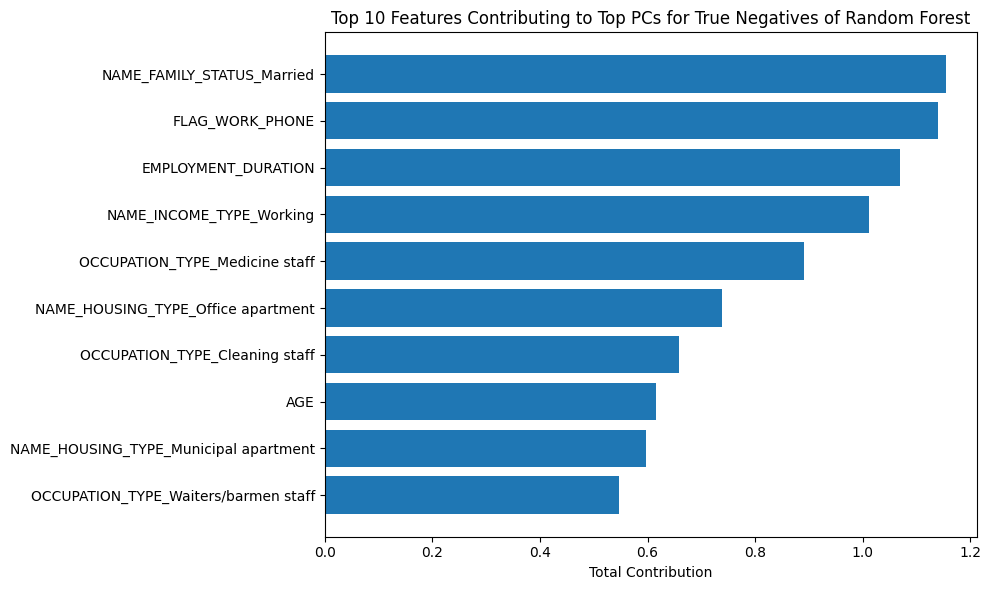

In [ ]:
top_pcs_TN_RF = [8, 2, 19, 6, 4]
lime_weights_TN_RF = [2.26, 3.09, 0.47, 1.07, 0.60]
features = X_train.columns

# Calculate feature contributions for each top Principal Component
contributions_TN_RF = np.zeros((len(features), len(top_pcs_TN_RF)))
for i, pc in enumerate(top_pcs_TN_RF):
  for j, feature in enumerate(features):
    contributions_TN_RF[j, i] = pca_loadings.iloc[pc, j] * lime_weights_TN_RF[i]

# Sum the contributions for each feature across all PCs
total_contributions_TN_RF = contributions_TN_RF.sum(axis = 1)

# Create a DataFrame to see the contributions for each feature
contribution_TN_RF_df = pd.DataFrame({
    'Feature': features,
    'Total Contribution': total_contributions_TN_RF
})

# Sort the features based on total contribution in descending order
contribution_TN_RF_df = contribution_TN_RF_df.sort_values(by = "Total Contribution", ascending = False)

# Display top 10 features
top_10_features_TN_RF = contribution_TN_RF_df.head(10)

# Plot the top 10 features' contributions
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(top_10_features_TN_RF['Feature'], top_10_features_TN_RF['Total Contribution'])
ax.set_xlabel('Total Contribution')
ax.set_title('Top 10 Features Contributing to Top PCs for True Negatives of Random Forest')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

## Logistic Regression

### False Positive Instances - Misclassification of Status '0'

In [ ]:
np.random.seed(42)

# Select an instance for False Positive for Logistic Regression Baseline Model
false_positives_LR = np.where((y_test =='0') & (y_pred_LR== '1'))[0]
print(f"False Positive Indices: {false_positives_LR}")

# Randomly select an instance of False Positive
random_instance_FP_LR = np.random.choice(false_positives_LR)
FP_LR_to_explain = X_test_pca[random_instance_FP_LR]
print(f"Random Instance of False Positive: {random_instance_FP_LR}")

# Explain the instance of False Positive
explanation_FP_LR = explainer.explain_instance(
    data_row = FP_LR_to_explain,
    predict_fn = LR_model.predict_proba,   # Model Prediction Function for LIME
    num_features = 5                       # Number of Features to display in the explanation. In this case, it refers to the number of Principal Components
)

# Show Explanation
explanation_FP_LR.show_in_notebook(show_table = True)

False Positive Indices: [   58   150   183   349   388   507   626   837  1092  1139  1230  1265
  1378  1456  1577  1779  1798  1935  1957  1969  2017  2077  2161  2218
  2394  2453  2486  2498  2767  2829  2900  2960  3004  3130  3144  3155
  3291  3387  3526  3684  3779  3854  4011  4057  4311  4432  4446  4694
  4856  4968  4981  5032  5040  5121  5129  5162  5204  5234  5242  5357
  5432  5445  5779  5820  5903  5921  5957  6095  6718  6842  6919  7019
  7023  7110  7265  7290  7555  7651  7990  7992  8016  8398  8408  8437
  8467  8696  8778  8883  8985  9008  9175  9280  9293  9611  9614  9935
 10010 10011 10217 10265 10319 10374 10755]
Random Instance of False Positive: 10755


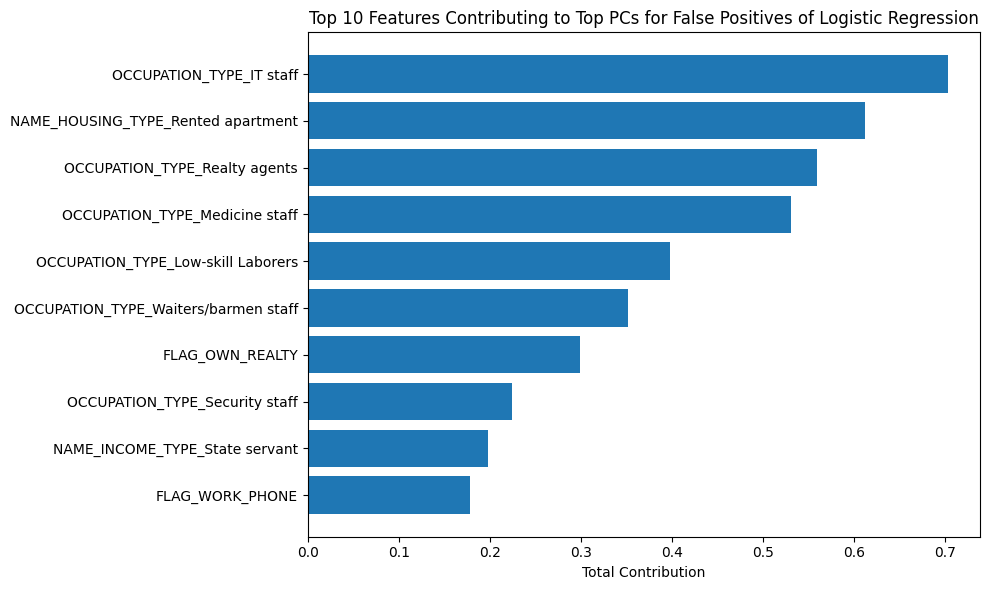

In [ ]:
top_pcs_FP_LR = [20, 22, 15, 26, 9]
lime_weights_FP_LR = [0.67, 1.43, 0.75, 0.24, -0.82]
features = X_train.columns

# Calculate feature contributions for each top Principal Component
contributions_FP_LR = np.zeros((len(features), len(top_pcs_FP_LR)))
for i, pc in enumerate(top_pcs_FP_LR):
  for j, feature in enumerate(features):
    contributions_FP_LR[j, i] = pca_loadings.iloc[pc, j] * lime_weights_FP_LR[i]

# Sum the contributions for each feature across all PCs
total_contributions_FP_LR = contributions_FP_LR.sum(axis = 1)

# Create a DataFrame to see the contributions for each feature
contribution_FP_LR_df = pd.DataFrame({
    'Feature': features,
    'Total Contribution': total_contributions_FP_LR
})

# Sort the features based on total contribution in descending order
contribution_FP_LR_df = contribution_FP_LR_df.sort_values(by = "Total Contribution", ascending = False)

# Display top 10 features
top_10_features_FP_LR = contribution_FP_LR_df.head(10)

# Plot the top 10 features' contributions
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(top_10_features_FP_LR['Feature'], top_10_features_FP_LR['Total Contribution'])
ax.set_xlabel('Total Contribution')
ax.set_title('Top 10 Features Contributing to Top PCs for False Positives of Logistic Regression')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

### True Negative Instances - Accurate Classification of Status '0'

In [ ]:
np.random.seed(42)

# Select an instance of True Negative for Logistic Regression Baseline Model
true_negatives_LR = np.where((y_test == '0') & (y_pred_LR == '0'))[0]
print(f"True Negative Indices: {true_negatives_LR}")

# Randomly select an instance of True Negative
random_instance_TN_LR = np.random.choice(true_negatives_LR)
TN_LR_to_explain = X_test_pca[random_instance_TN_LR]
print(f"Random Instance of True Negative: {random_instance_TN_LR}")

# Explain the instance of False Positive
explanation_TN_LR = explainer.explain_instance(
    data_row = TN_LR_to_explain,
    predict_fn = LR_model.predict_proba,   # Model Prediction Function for LIME
    num_features = 5                       # Number of Features to display in the explanation. In this case, it refers to the number of Principal Components
)

# Show Explanation
explanation_TN_LR.show_in_notebook(show_table = True)

True Negative Indices: [  376   407   628  1192  1214  1278  1295  1469  1628  1631  1685  1842
  2149  2241  2478  2542  2605  2634  2841  2862  2870  3527  3606  3657
  4223  4786  4966  5225  5477  5855  6009  6359  6853  6889  7093  7763
  8101  8238  8562  8986  9276  9564  9672 10482 10547]
Random Instance of True Negative: 8562


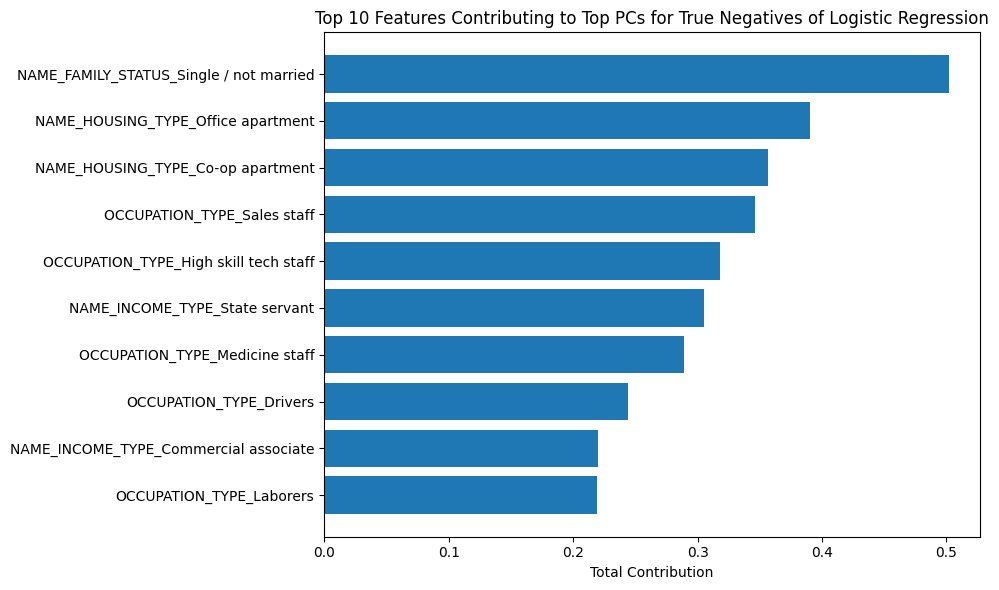

In [ ]:
top_pcs_TN_LR = [13, 15, 9, 21, 14]
lime_weights_TN_LR = [0.58, -0.58, -1.75, -0.33, 0.39]
features = X_train.columns

# Calculate feature contributions for each top Principal Component
contributions_TN_LR = np.zeros((len(features), len(top_pcs_TN_LR)))
for i, pc in enumerate(top_pcs_TN_LR):
  for j, feature in enumerate(features):
    contributions_TN_LR[j, i] = pca_loadings.iloc[pc, j] * lime_weights_TN_LR[i]

# Sum the contributions for each feature across all PCs
total_contributions_TN_LR = contributions_TN_LR.sum(axis = 1)

# Create a DataFrame to see the contributions for each feature
contribution_TN_LR_df = pd.DataFrame({
    'Feature': features,
    'Total Contribution': total_contributions_TN_LR
})

# Sort the features based on total contribution in descending order
contribution_TN_LR_df = contribution_TN_LR_df.sort_values(by = "Total Contribution", ascending = False)

# Display top 10 features
top_10_features_TN_LR = contribution_TN_LR_df.head(10)

# Plot the top 10 features' contributions
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(top_10_features_TN_LR['Feature'], top_10_features_TN_LR['Total Contribution'])
ax.set_xlabel('Total Contribution')
ax.set_title('Top 10 Features Contributing to Top PCs for True Negatives of Logistic Regression')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Model Comparison

Use **macro-average recall** for comparison because minimizing false negatives (wrongly predicting rejected applicants as accepted) is crucial to reducing financial risks for banks.

*   Recall(Logistic Regression) = 0.50
*   Recall(Random Forest) = 0.60
*   Recall(Decision Tree) = 0.63

Decision Tree has highest recall. Hence, Decision Tree is the most suitable model to predict credit card approval.


# Possible Improvements
1. **Apply SMOTE-NC, PCA to each K-Fold CV Train Set** --> Reduce leakage of validation set information into training data.


2. **Better Labeling** --> More context on dataset, more minority class data, access to labeled data.



## Decision Tree Implementation of Improvement 1
### SMOTE-NC, PCA applied to each K-Fold CV Train Set
1. Conduct K-Fold Cross Validation on the Train Set
2. Define Different Hyperparameters and Hyperparameter Grid (Possible Combinations)
3. For each Hyperparameter Combination, Split into K-Fold, leave one fold for Validation Set
4. **Within each train fold**, apply SMOTE-NC, PCA. Evaluate average performance for this hyperparameter with Validation Set.
5. Choose best hyperparameter combination with best performance

In [ ]:
X_train = pd.DataFrame(X_train)
y_train = pd.Series(y_train)

best_DT_model = None
best_DT_fold_score = 0

# Set a range of hyperparameters to tune the model
hyperparam_grid_DT = {
    'max_depth': [10, 15, 20, None],   # higher val -> deeper tree
    'min_samples_split': [2, 5, 10, 15],   # higher val -> simpler tree (less overfitting)
    'min_samples_leaf': [2, 5, 10],    # higher val -> simpler tree
    'criterion': ['gini', 'entropy'],
    'max_features': [None, 'sqrt', 'log2']
}

# Create all possible combination of hyperparameter values
hyperparam_combi_DT = list(product(*hyperparam_grid_DT.values()))

# Initialise K-Fold
kf_DT = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [ ]:
print(X_train.shape)
print(y_train.shape)
print(len(hyperparam_combi_DT))

(25519, 47)
(25519,)
288


In [ ]:
results_DT = []

# Loop through all the possible Hyperparameter Combinations for Decision Trees
for hyperparam_DT in hyperparam_combi_DT:

  # Create List to store Validation Scores for each fold
  fold_scores_DT = []

  # K-Fold Cross Validation
  for train_index, val_index in kf_DT.split(X_train, y_train):
    X_fold_train, X_fold_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_fold_train, y_fold_val = y_train.iloc[train_index], y_train.iloc[val_index]

    # Apply SMOTE-NC to each fold
    smote = SMOTENC(categorical_features=categorical_features, random_state=42)
    X_fold_train_res, y_fold_train_res = smote.fit_resample(X_fold_train, y_fold_train)

    # Feature Scaling
    X_fold_train_sc = sc.fit_transform(X_fold_train_res)
    X_fold_val_sc = sc.transform(X_fold_val)

    # Apply PCA
    X_fold_train_pca = pca.fit_transform(X_fold_train_sc)
    X_fold_val_pca = pca.transform(X_fold_val_sc)

    # Train the Decision Tree with the Hyperparameters
    DT_model = DecisionTreeClassifier(max_depth = hyperparam_DT[0],
                                      min_samples_split = hyperparam_DT[1],
                                      min_samples_leaf = hyperparam_DT[2],
                                      criterion = hyperparam_DT[3],
                                      max_features = hyperparam_DT[4]
    )
    DT_model.fit(X_fold_train_pca, y_fold_train_res)

    # Validation
    y_fold_predict = DT_model.predict(X_fold_val_pca)
    fold_score_DT = accuracy_score(y_fold_val, y_fold_predict)
    fold_scores_DT.append(fold_score_DT)

  # Store average score for this hyperparameter combination
  avg_score_DT = sum(fold_scores_DT) / len(fold_scores_DT)
  results_DT.append((hyperparam_DT, avg_score_DT))

# Select Best Hyperparameters for Decision Tree
best_hyperparam_DT = max(results_DT, key=lambda x: x[1])
print(f"Best Hyperparameters for Decision Tree: {best_hyperparam_DT[0]}, Score: {best_hyperparam_DT[1]}")

KeyboardInterrupt: 

#### Train Best DT Model and evaluate with Test Set

In [ ]:
# Apply SMOTE-NC on full Train Set
smote = SMOTENC(categorical_features=categorical_features, random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Feature Scaling on Full Train Set
X_train_sc = sc.fit_transform(X_train_res)
X_test_sc = sc.transform(X_test)

# Apply PCA on Full Train Set
X_train_pca = pca.fit_transform(X_train_sc)
X_test_pca = pca.transform(X_test_sc)

# List Best Hyperparameters for Decision Tree
best_hyperparam_DT_values = best_hyperparam_DT[0]

# Train optimised Decision Tree with entire Train Set
opt_DT_model = DecisionTreeClassifier(max_depth = None, min_samples_split = 2, min_samples_leaf = 5, random_state = 42)
opt_DT_model.fit(X_train_pca, y_train_res)

# Evaluate optimised Decision Tree Model on Test Set
y_pred_DT_opt = opt_DT_model.predict(X_test_pca)
conf_matrix_DT_opt = confusion_matrix(y_test, y_pred_DT_opt)

print(conf_matrix_DT_opt)

In [ ]:
print(classification_report(y_test, y_pred_DT_opt))

# Calculate the ROC curve
y_test_numeric = y_test.astype(int)
fpr_logistic, tpr_logistic, _ = roc_curve(y_test_numeric, opt_DT_model.predict_proba(X_test_pca)[:, 1])

# Plot the AUC-ROC Curve
plt.figure()
plt.plot(fpr_logistic, tpr_logistic, color='blue', label='ROC curve (area = {:.2f})'.format(roc_auc_RF))
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line for random guessing
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC - Decision Tree (optimised)')
plt.legend(loc='lower right')
plt.show()